<a href="https://colab.research.google.com/github/Satyam1018/ML_Unsupervised---Netflix-Movies-TV-Shows-Clustering/blob/main/ML_Unsupervised_Netflix_Movies_%26_TV_Shows_Clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Netflix Movies and TV Shows Clustering



## **Project Type**    - Unsupervised
## **Contribution**    - Individual
## **Name**            - Satyam Ojha
## **Batch**           - Cohort Delhi

# 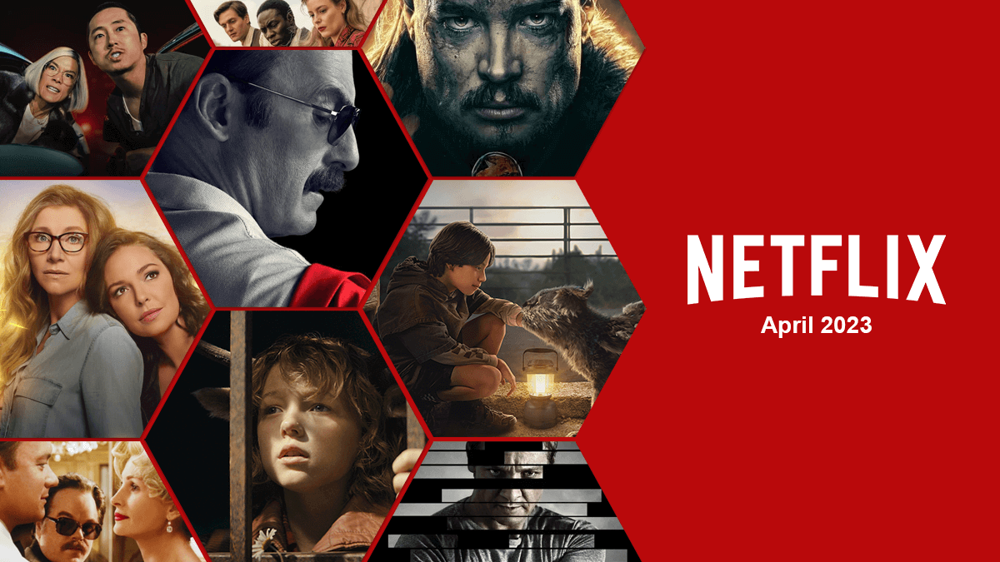

# **Project Summary -**



The objective of this project is to analyze and cluster a dataset related to Netflix. **The dataset consists of various attributes associated with Netflix shows and movies, such as title, genre, release year, duration, rating, and others. The aim is to explore patterns and similarities among the content available on the platform and group them into meaningful clusters**.

To begin with, the dataset will be preprocessed by handling missing values, removing irrelevant columns, and transforming categorical variables into numerical representations. Feature engineering techniques may also be applied to extract useful information from the existing attributes.

Next, exploratory data analysis (EDA) techniques will be utilized to gain insights into the dataset. **Visualizations and statistical summaries will be used to understand the distribution of variables, identify any trends, and explore relationships between different features**.

Once the dataset has been thoroughly analyzed, clustering algorithms such as k-means, hierarchical clustering, or density-based spatial clustering will be employed. These algorithms will group similar Netflix shows and movies together based on their attributes. **The optimal number of clusters will be determined using techniques like the elbow method or silhouette analysis.**

After the clustering process, the results will be evaluated and interpreted. **The clusters will be analyzed to understand the common characteristics and patterns within each group. This analysis will provide valuable information for Netflix in terms of content categorization, recommendation systems, and content acquisition strategies**.

Finally, the findings and insights from the clustering analysis will be summarized and presented in a clear and concise manner. Visualizations, charts, and graphs will be used to effectively communicate the outcomes of the project. **Recommendations may also be provided based on the identified clusters, suggesting potential improvements or strategies for Netflix** to enhance user experience and content offerings.

**In conclusion, this project aims to analyze a Netflix dataset, perform clustering techniques to group similar shows and movies together, and provide insights and recommendations based on the clustering results. The project will contribute to a better understanding of Netflix's content landscape and aid in decision-making processes for the company**.

# **GitHub Link -**

https://github.com/Satyam1018/ML_Unsupervised---Netflix-Movies-TV-Shows-Clustering

# **Problem Statement**


This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine.

In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.

In this project, you are required to do :

* Exploratory Data Analysis
* Understanding what type content is available in different countries
* Is Netflix has increasingly focusing on TV rather than movies in recent years.
* Clustering similar content by matching text-based features

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [162]:
### Importing necessary libraries

# For scientific computation and processing array elements.
import numpy as np
from scipy.stats import norm
from scipy import stats

# Importing pandas
import pandas as pd

# For plotting statstical visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Updating nltk library
import nltk
nltk.download('stopwords')
nltk.download('punkt')


# libraries used to process textual data
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
# For corpus lemmatization
from nltk.stem import WordNetLemmatizer
import scipy.cluster.hierarchy as shc
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

# Import regex library
import re

# Import BeautifulSoup library
from bs4 import BeautifulSoup

# For pretty-printing tabular data
from tabulate import tabulate

# KElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer,SilhouetteVisualizer
from yellowbrick.cluster.elbow import kelbow_visualizer

# Importing clustering Evaluation metrics
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Install yellowbrick library
!pip install yellowbrick

# Importing library for Hypothesis testing
from statsmodels.stats.proportion import proportions_ztest
import scipy


# For Cross-Validation and Hyperparameter Tuning
from sklearn.model_selection import GridSearchCV

# Importing algorithams for building model
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics.pairwise import cosine_similarity

# importing library for visualization
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import altair as alt
import pandas as pd

# To ignore warnings
import warnings
warnings.filterwarnings('ignore')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Dataset Loading

In [163]:
# Load Dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [164]:
dataset = '/content/drive/MyDrive/DataSets_Almabetter/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv'
netflix_df = pd.read_csv(dataset)

### Dataset First View

In [165]:
# Dataset First Look
netflix_df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [166]:
netflix_df.tail()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


### Dataset Rows & Columns count

In [167]:
# Dataset Rows & Columns count
netflix_df.shape

(7787, 12)

### Dataset Information

In [168]:
# Dataset Info
netflix_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [169]:
# Dataset Duplicate Value Count
netflix_df.duplicated().sum()

0

#### Missing Values/Null Values

In [170]:
# Missing Values/Null Values Count
netflix_df.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

<Axes: >

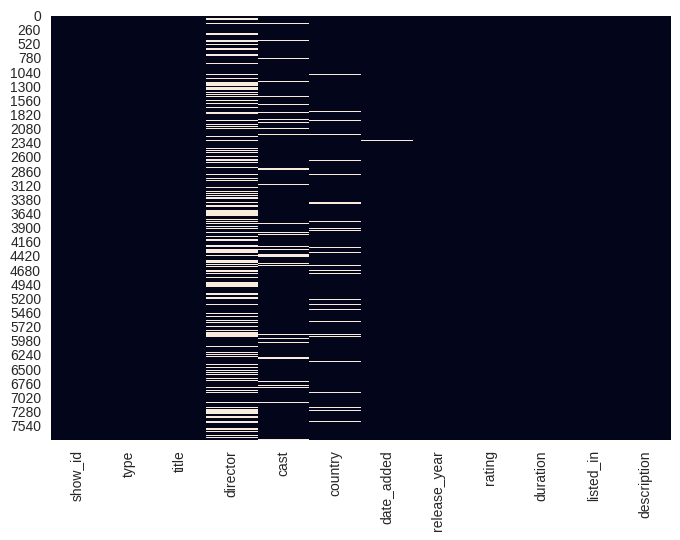

In [171]:
# Visualizing the missing values
sns.heatmap(netflix_df.isnull(), cbar = False)

<function matplotlib.pyplot.show(close=None, block=None)>

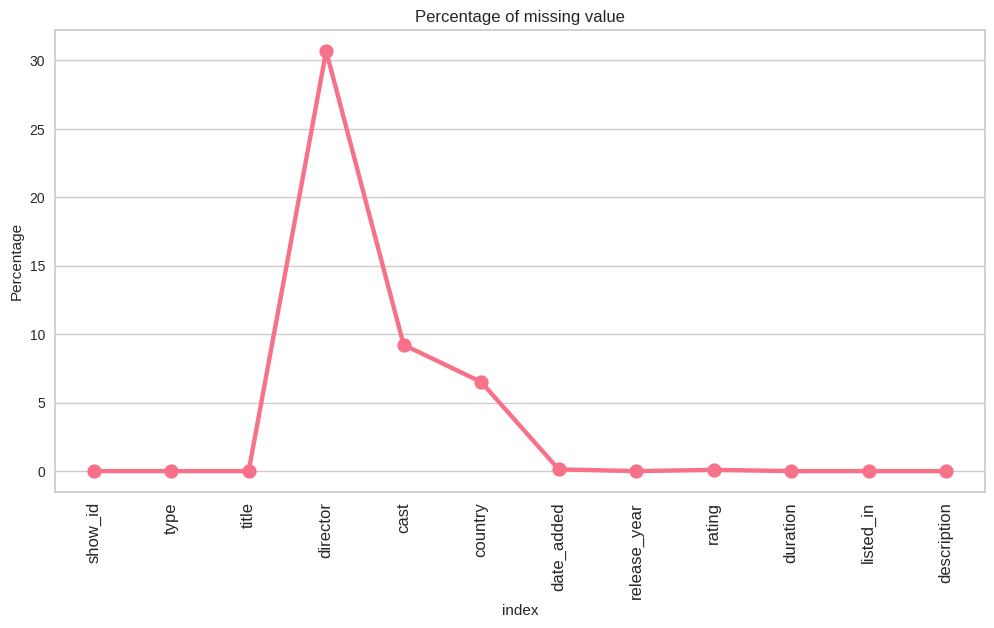

In [172]:
missing_val = pd.DataFrame(netflix_df.isnull().sum()*100/netflix_df.shape[0]).reset_index()
plt.figure(figsize = (12,6))
xa = sns.pointplot(x = 'index', y = 0, data = missing_val)
plt.xticks(rotation = 90, fontsize = 12)
plt.title('Percentage of missing value')
plt.ylabel('Percentage')
plt.show

### What did you know about your dataset?

* This dataset contain information about various TV shows and movies available on Netflix, including details like the production country, release year, rating, duration, genre, and a description of each title.

* This dataset consists of 12 columns and 7787 rows.

* This dataset do not have any duplicate values.

* In this dataset we have some null values in perticular feature like director, cast and country.

## ***2. Understanding Your Variables***

In [173]:
# Dataset Columns
netflix_df.columns.to_list()

['show_id',
 'type',
 'title',
 'director',
 'cast',
 'country',
 'date_added',
 'release_year',
 'rating',
 'duration',
 'listed_in',
 'description']

In [174]:
# Dataset Describe
netflix_df.describe()

,release_year
count,7787.000000
mean,2013.932580
std,8.757395
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2018.000000
max,2021.000000


### Variables Description

* **show_id** - Unique identifier for each movie or TV show.

* **type** - Indicates whether the entry is a movie or a TV show.

* **title** - The title of the movie or TV show.

* **director** - The director(s) of the movie or TV show.

* **cast** - The cast or actors appearing in the movie or TV show.

* **country** - The country or countries where the movie or TV show was produced.

* **date_added** - The date when the movie or TV show was added to the Netflix platform.

* **release_year** - The year when the movie or TV show was released.

* **rating** - Viewer rating or content rating for the movie or TV show.

* **duration** - The duration of the movie or TV show. For movies, this is typically in minutes, and for TV shows, it may indicate the number of seasons and episodes.

* **listed_in** - The categories or genres to which the movie or TV show belongs.

* **description** - A brief description or summary of the movie or TV show.

### Check Unique Values for each variable.

In [175]:
# Check Unique Values for each variable.
netflix_df.nunique()

show_id         7787
type               2
title           7787
director        4049
cast            6831
country          681
date_added      1565
release_year      73
rating            14
duration         216
listed_in        492
description     7769
dtype: int64

## 3. ***Data Wrangling***

### Data Wrangling Code

### **3.1 - Handling Missing Values**

In [176]:
# Write your code to make your dataset analysis ready.
#Handling Null Values
netflix_df['cast'].fillna(value='No cast',inplace=True)

netflix_df['country'].fillna(value=netflix_df['country'].mode()[0],inplace=True)

netflix_df['director']=netflix_df['director'].fillna('')

# Filling missing values with forward fill.
netflix_df['date_added'].fillna(method='ffill', inplace=True)  # Forward fill

netflix_df['rating'].fillna(method='ffill', inplace=True)  # Forward fill



## **3.2 - Create new column**

In [177]:
# Create new features to store date, day, month and year seperately.
netflix_df["date_added"] = pd.to_datetime(netflix_df['date_added'])  # First convert date_added to date time format.
netflix_df['day_added'] = netflix_df['date_added'].dt.day            # Compute day.
netflix_df['year_added'] = netflix_df['date_added'].dt.year          # Compute year.
netflix_df['month_added'] = netflix_df['date_added'].dt.month        # Compute month.

## **3.3 - Checking Outliers on release_year column**

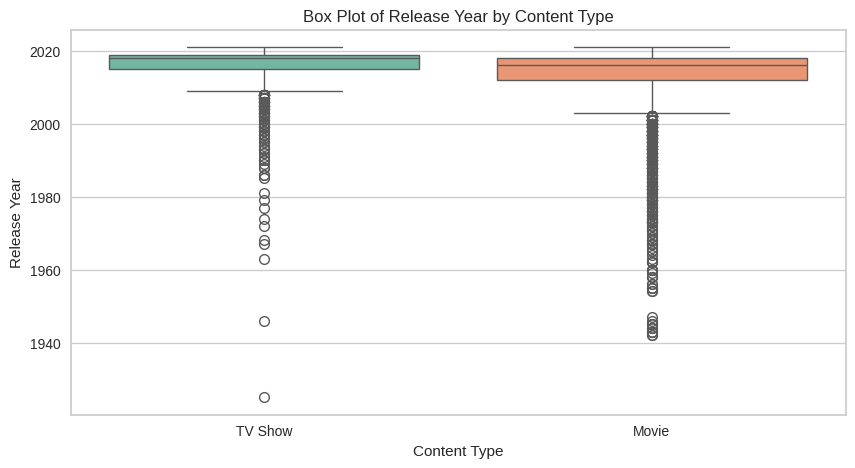

In [178]:
plt.figure(figsize=(10, 5))
sns.boxplot(x='type', y='release_year', data=netflix_df, palette='Set2')  # Change palette to 'Set2'
plt.title('Box Plot of Release Year by Content Type')
plt.xlabel('Content Type')
plt.ylabel('Release Year')
plt.show()


* As we have seen earlier **before 2014 the production growth for Movies & Tv Shows were very less**, that's why it's showing those values(release_year less than 2009) as outliers

* **Replacing outliers with mean value**

In [179]:
release_year_Q1 = netflix_df['release_year'].quantile(0.25)
release_year_Q3 = netflix_df['release_year'].quantile(0.75)
release_year_IQR = release_year_Q3 - release_year_Q1

print(f"release_year_Q1 = {release_year_Q1}\nrelease_year_Q3 = {release_year_Q3}\nrelease_year_IQR = {release_year_IQR}")

release_year_Q1 = 2013.0
release_year_Q3 = 2018.0
release_year_IQR = 5.0


* we don't have have any release_year which is greater than 2018.

In [180]:
release_year_outliers = netflix_df[(netflix_df.release_year < (release_year_Q1 - 1.5 * release_year_IQR)) | ( netflix_df.release_year > (release_year_Q3 + 1.5 * release_year_IQR)) ]

* **Handling outliers with Mean imputation**

In [181]:
# 15 percentile value is 2009
netflix_df["release_year"] = np.where(netflix_df["release_year"] < 2009, netflix_df['release_year'].mean(), netflix_df['release_year'])

* **After removing Outliers**

<Axes: ylabel='release_year'>

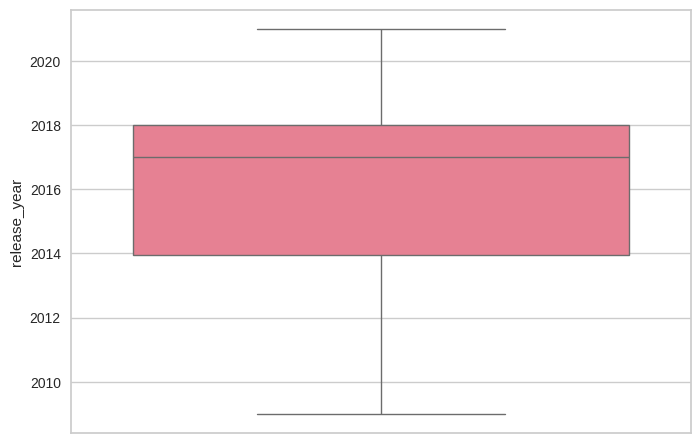

In [182]:
sns.boxplot(netflix_df.release_year)

### **What all manipulations have you done and insights you found?**

We can gather the following insights from the dataset:

**Director:** There are missing values in the "Director" column.

**Country:** There are missing values in the "Country" column, which have been filled with zero.

**Cast:** There are missing values in the "Cast" column, which have been filled with "No cast."

**Date Added:** There are missing values in the "Date Added" column.

**Date_addded Column:** In the "Date Added" column, additional information has been extracted such as the day, month, and year.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

## **1 - Type of Content Watched on Netflix**

In [183]:
labels = ['TV Show', 'Movie']
values = [netflix_df.type.value_counts()[1], netflix_df.type.value_counts()[0]]
# Colors
colors = ['#ffd700', '#008000']
# Create pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.6)])
# Customize layout
fig.update_layout(
    title_text='Type of Content Watched on Netflix',
    title_x=0.5,
    height=500,
    width=500,
    legend=dict(x=0.9),
    annotations=[dict(text='Type of Content', font_size=20, showarrow=False)]
)
# Set colors
fig.update_traces(marker=dict(colors=colors))

##### **1. Why did you pick the specific chart?**

* The specific chart used in the code is a pie chart. I picked this chart because it is effective in visualizing the distribution of categorical data. In this case, the chart is used to represent the types of content watched on Netflix, which are categorized as "TV Show" and "Movie."

##### **2. What is/are the insight(s) found from the chart?**

* TV shows constitute the majority, accounting for 69.1% of the content watched on Netflix, while movies make up a smaller percentage of 30.9%

##### **3. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

* The data indicates a clear preference for TV shows over movies, with a significantly higher percentage of 69.1% compared to the lower percentage of 30.9% for movies. This suggests that people tend to enjoy shorter formats like TV shows rather than investing their time in longer movies that may be less engaging.

## **2 - Content added over the years**

In [184]:
# Chart - 2 visualization code
tv_show = netflix_df[netflix_df["type"] == "TV Show"]
movie = netflix_df[netflix_df["type"] == "Movie"]

col = "year_added"

content_1 = tv_show["year_added"].value_counts().sort_index()
content_2 = movie["year_added"].value_counts().sort_index()

trace1 = go.Scatter(x=content_1.index, y=content_1.values, name="TV Shows", marker=dict(color='#008000', line=dict(width=4)))
trace2 = go.Scatter(x=content_2.index, y=content_2.values, name="Movies", marker=dict(color='#ffd700', line=dict(width=4)))

fig = go.Figure(data=[trace1, trace2], layout=go.Layout(title="Content added over the years",title_x=0.5, legend=dict(x=0.8, y=1.1, orientation="h")))
fig.show()

##### **1. Why did you pick the specific chart?**


* The line chart is suitable for showing the trend and distribution of data over a continuous axis (in this case, the years). It allows for easy comparison between the two categories (TV shows and movies) and how their counts vary over time.

##### **2. What is/are the insight(s) found from the chart?**

* The trend in the visualization indicates that between 2008 and 2022, there were relatively fewer TV shows and movies added to Netflix. However, starting from 2016, there was a slight increase in content additions. In 2019, there was a significant peak in the number of movies added, while TV shows experienced a similar trend but with a lesser increase compared to movies.

##### **3. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

* The gained insights indicate a positive impact for Netflix as the demand for both TV shows and movies on the platform has been increasing rapidly over the years. This growth presents an opportunity for Netflix to provide more high-quality content to its users, thereby enhancing user satisfaction and engagement.

## **3 - Month wise Addition of Movies and TV Shows on Netflix**

In [185]:
# Chart - 3 visualization code
# Create a DataFrame to store month values and counts
months_df = pd.DataFrame(netflix_df['month_added'].value_counts())

# Reset the index to create a "month" column
months_df.reset_index(inplace=True)

# Rename the columns to "month" and "count"
months_df.rename(columns={'index': 'month', 'month_added': 'count'}, inplace=True)

fig = px.bar(months_df, x="month", y="count", text_auto=True, color='count', color_continuous_scale=['#0000FF', '#FFFF00'])
fig.update_layout(
    title={
        'text': 'Month wise Addition of Movies and TV Shows on Netflix',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        autosize=False,
        width=1000,
        height=500,
        showlegend=True)
# fig.show()
fig.show()

##### **1. Why did you pick the specific chart?**

* The bar chart is suitable for comparing and displaying categorical data (months) and their corresponding counts. The chart helps in understanding the distribution of content additions across different months and identifying any patterns or trends.

##### **2. What is/are the insight(s) found from the chart?**

* During the months of October to December, there is a noticeable surge in the number of TV shows and movies being released on the Netflix platform.The months of October to December are known for having various holidays and celebrations, such as Halloween, Diwali, Thanksgiving, and Christmas, which often result in people spending more time at home and seeking entertainment options

##### **3. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

* The gained insights regarding the increase in TV shows and movies on the Netflix platform during the months of October to December can potentially create a positive business impact. Here are a few reasons:-

**1 - Meeting Seasonal Demand**

**2 - Retaining Existing Subscribers**

**3 - Attracting New Subscribers**

## **4 - Content updation Month wise**

<Axes: xlabel='month_added', ylabel='count'>

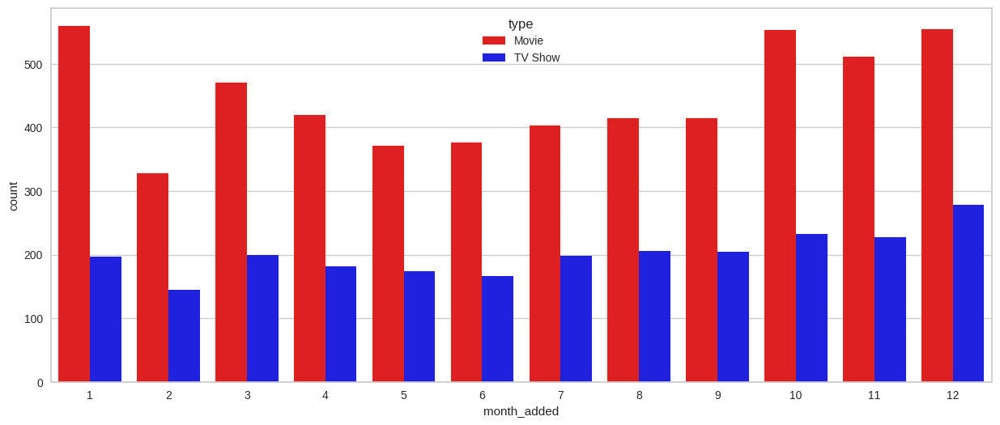

In [186]:
# Chart - 4 visualization code
# Chart - 4 visualization code
import matplotlib.pyplot as plt
import seaborn as sns
fig, ax = plt.subplots(figsize=(15,6))
sns.countplot(x='month_added', hue='type',lw=5, data=netflix_df, ax=ax,palette=['#FF0000' ,'#0000FF'])

##### **1. Why did you pick the specific chart?**

* By using a countplot, we can easily see and compare the frequencies of TV show and movie additions for each month.

##### **2. What is/are the insight(s) found from the chart?**

**Movies:**

* January, October, and December appear to be the trending months for movie additions on Netflix compared to other months.

**Tv Shows:**

* October, November, and December emerge as the trending months for TV show additions on Netflix compared to other months.



##### **3. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

* The gained insights regarding the trending months for movies and TV shows on Netflix can potentially create a positive business impact. Here's why:

**1 - Meeting Viewer Demand:**

**2 - Capitalizing on Seasonal Trends:**

**3 - Improved Competitiveness:**

## **5 - Distribution of TV Shows duration**

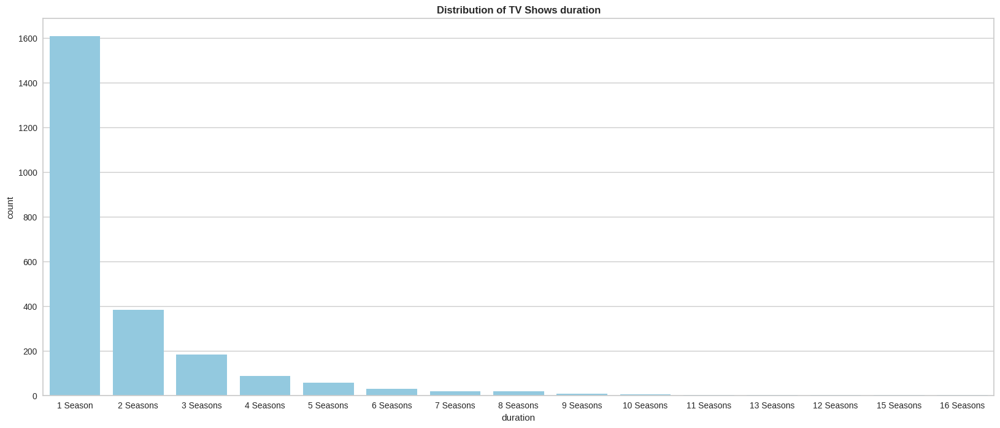

In [187]:
# Chart - 5 visualization code
plt.figure(figsize=(20, 8))
plt.title("Distribution of TV Shows duration", fontweight='bold')
sns.countplot(x=tv_show['duration'], data=tv_show, order=tv_show['duration'].value_counts().index, color='skyblue')
plt.show()

##### **1. Why did you pick the specific chart?**

* The chart in question is a countplot, which is a type of bar chart that shows the frequency or count of each category in a categorical variable. It seems to be used to display the distribution of TV show seasons

##### **2. What is/are the insight(s) found from the chart?**

* From the chart, we observed that the majority of TV shows or web series in the dataset have only one season, while the remaining shows have a maximum of two, three, four, or five seasons.

##### **3. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

* Yes, **Positive Impact** because by recognizing that the majority of TV shows have a limited number of seasons, content producers and streaming platforms can optimize their production planning. They can allocate resources more efficiently, reduce production costs, and potentially increase the output of content.

## **6 - Top 10 TV show actors & Movie actors**

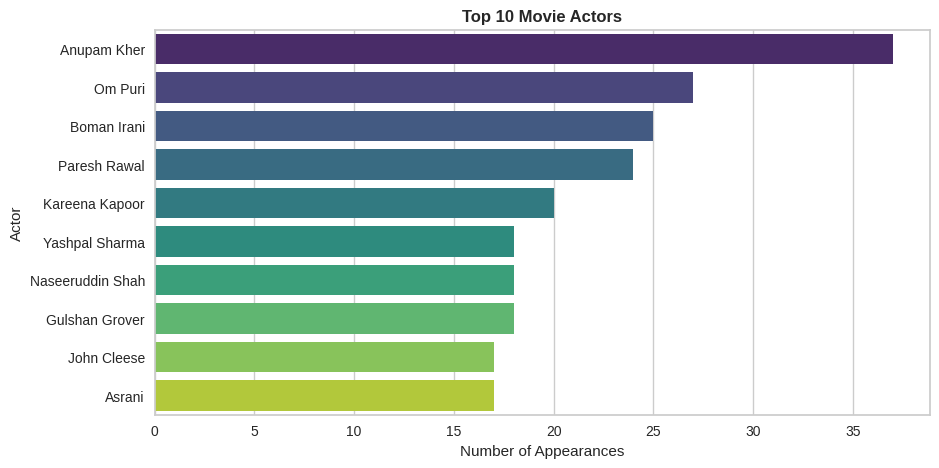

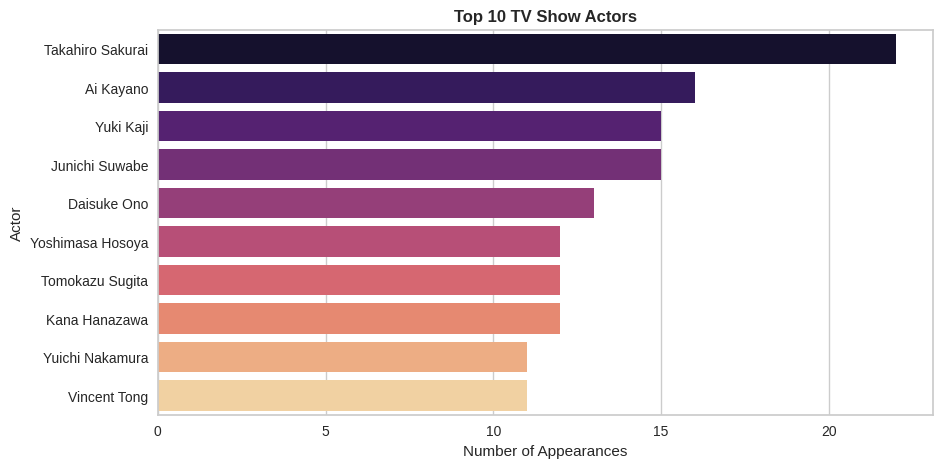

In [188]:
# Extracting data for movies and TV shows
movies_data = netflix_df[netflix_df['type'] == 'Movie']
tv_shows_data = netflix_df[netflix_df['type'] == 'TV Show']

# Removing null values from cast column
movies_data['cast'] = movies_data['cast'].apply(lambda x: x.split(', ')[1:] if isinstance(x, str) else x)
tv_shows_data['cast'] = tv_shows_data['cast'].apply(lambda x: x.split(', ')[1:] if isinstance(x, str) else x)

# Counting occurrences of actors in movies and TV shows
movies_cast_counts = movies_data['cast'].explode().value_counts()
tv_shows_cast_counts = tv_shows_data['cast'].explode().value_counts()

# Getting top 10 actors for movies and TV shows
top_10_movie_actors = movies_cast_counts.head(10)
top_10_tv_actors = tv_shows_cast_counts.head(10)

# Plotting the top 10 movie actors
plt.figure(figsize=(10, 5))
sns.barplot(x=top_10_movie_actors.values, y=top_10_movie_actors.index, palette='viridis')
plt.title('Top 10 Movie Actors', fontweight='bold')
plt.xlabel('Number of Appearances')
plt.ylabel('Actor')
plt.show()

# Plotting the top 10 TV show actors
plt.figure(figsize=(10, 5))
sns.barplot(x=top_10_tv_actors.values, y=top_10_tv_actors.index, palette='magma')
plt.title('Top 10 TV Show Actors', fontweight='bold')
plt.xlabel('Number of Appearances')
plt.ylabel('Actor')
plt.show()


##### **1. Why did you pick the specific chart?**

* The horizontal orientation of the bars allows for easier reading and comparison of the values. The length of each bar represents the number of TV shows or movies an actor has appeared in.

##### **2. What is/are the insight(s) found from the chart?**

* In the TV shows category, the actor with the highest appearance is **Takahiro Sakurai.** In the movies category, the actor with the highest appearance is **Anupam Kher.**

## **7 - Plotting the top 10 genres**

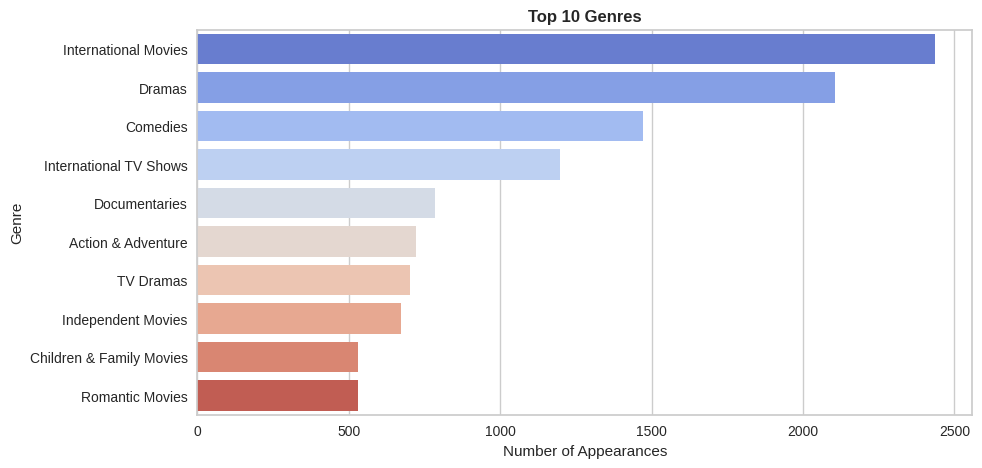

In [189]:
genre_counts = netflix_df['listed_in'].str.split(', ').explode().value_counts().head(10)

# Plotting the top 10 genres
plt.figure(figsize=(10, 5))
sns.barplot(x=genre_counts.values, y=genre_counts.index, palette='coolwarm')
plt.title('Top 10 Genres', fontweight='bold')
plt.xlabel('Number of Appearances')
plt.ylabel('Genre')
plt.show()


##### **1. What is/are the insight(s) found from the chart?**

In this chart, the top three genres on Netflix based on their distribution are:

1 - **Documentaries:** 14.4%

2 - **Stand-up Comedy:** 13.9%

3 - **Drama, International Movies:**1 3.8%

These genres have the highest percentages compared to the other genres included in the top 10 list.

##### **2. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

The gained insights from analyzing the distribution of genres on Netflix can potentially help create a positive business impact in several ways

1 - **Content Curation :** By focusing on genres that have high viewer demand, Netflix can ensure that it offers a diverse and appealing selection of movies and shows to its subscribers

2 - **Targeted Acquisitions and Productions :** It can guide them in identifying genres that are in high demand and have a proven audience. This can optimize their investments in content creation and acquisition

3 - **Personalized Recommendations:** Personalized recommendations for individual users, improving their overall experience and encouraging them to spend more time on the platform.



## **8 - Top 10 Countries and Content Types**

<Figure size 1200x600 with 0 Axes>

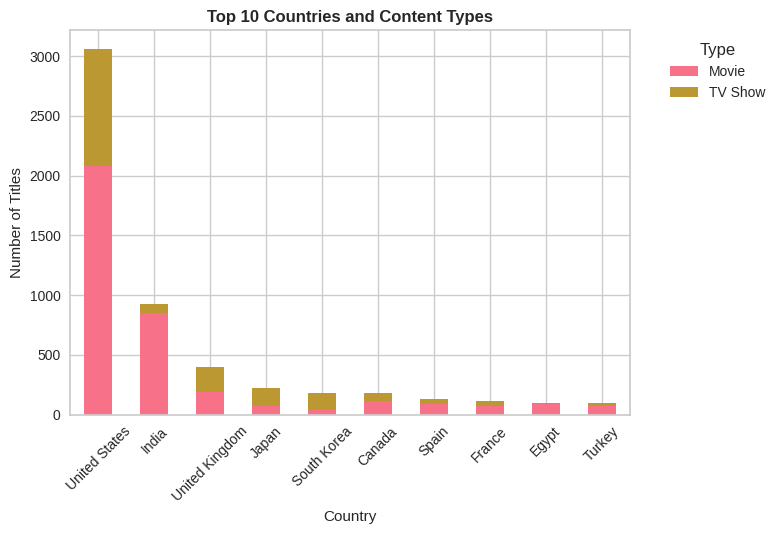

In [190]:
# Calculate the total number of titles per country
total_titles_by_country = netflix_df['country'].value_counts()

# Select the top 10 countries based on the total number of titles
top_countries = total_titles_by_country.head(10).index

# Filter the DataFrame to include only the top countries
filtered_df = netflix_df[netflix_df['country'].isin(top_countries)]

# Group by country and type and calculate the count of titles
content_counts_by_country = filtered_df.groupby(['country', 'type']).size().unstack(fill_value=0)

# Sort the DataFrame based on the total number of titles in descending order
content_counts_by_country = content_counts_by_country.loc[total_titles_by_country[top_countries].index]

# Plotting
plt.figure(figsize=(12, 6))
sns.set_palette("husl")  # Set a custom color palette
content_counts_by_country.plot(kind='bar', stacked=True)
plt.title('Top 10 Countries and Content Types', fontweight='bold')
plt.xlabel('Country')
plt.ylabel('Number of Titles')
plt.xticks(rotation=45)
plt.legend(title='Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


##### **1. What is/are the insight(s) found from the chart?**

* United States is the most content provide county for TV shows and movies both.
* Turkey is the least content provide country for TV shows and movies both.

##### **2. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

1 - **Targeted Content Strategy:** By understanding the genre preferences in different countries, businesses can develop a targeted content strategy that aligns with the interests of their target audience.

2 - **Market Expansion:** The insights can help businesses identify countries where their content genres are highly popular. This knowledge can guide expansion plans and investment in those markets, increasing the chances of success and profitability.

## **9 - Distribution of Ratings for Movies and TV Shows**

**Variables Description- Rating**

- **TV-Y**: This rating means that the content is appropriate for all children. It is aimed at children aged 2-6 and may include educational programming.

- **TV-Y7**: This rating means that the content is appropriate for children aged 7 and up. It may contain mild violence, comic mischief, or scary content that may not be suitable for younger children.

- **TV-Y7-FV:** This rating means that the content is appropriate for children aged 7 and up, but may contain more intense violence. The "FV" stands for "fantasy violence".

- **TV-G:** This rating means that the content is appropriate for all ages. It may contain mild language or violence, but nothing too intense.

- **TV-PG:** This rating means that parental guidance is suggested. The content may contain material that parents might find inappropriate for younger children. It may include mild to moderate language, violence, or suggestive content.

- **TV-14:** This rating means that the content is appropriate for viewers aged 14 and up. It may include intense violence, strong language, or sexual situations.

- **TV-MA:** This rating means that the content is intended for mature audiences only. It may include graphic violence, explicit sexual content, or strong language.

- **G**- This rating means that the content is appropriate for all ages. It is usually intended for young children and may include animated or family-friendly content.

- **PG:** This rating means that parental guidance is suggested. The content may include mild violence, language, or suggestive themes.

- **PG-13:**This rating means that the content is appropriate for teens aged 13 and up. It may include intense violence, language, or suggestive content.

- **R:** This rating means that the content is intended for adults. It may include graphic violence, strong language, or nudity.

- **NC-17:** This rating means that the content is intended for mature audiences only and may contain explicit sexual content or violence that is not suitable for minors.

- **NR:** This rating means that no rating has been assigned yet or that the content is not rated by a particular board.

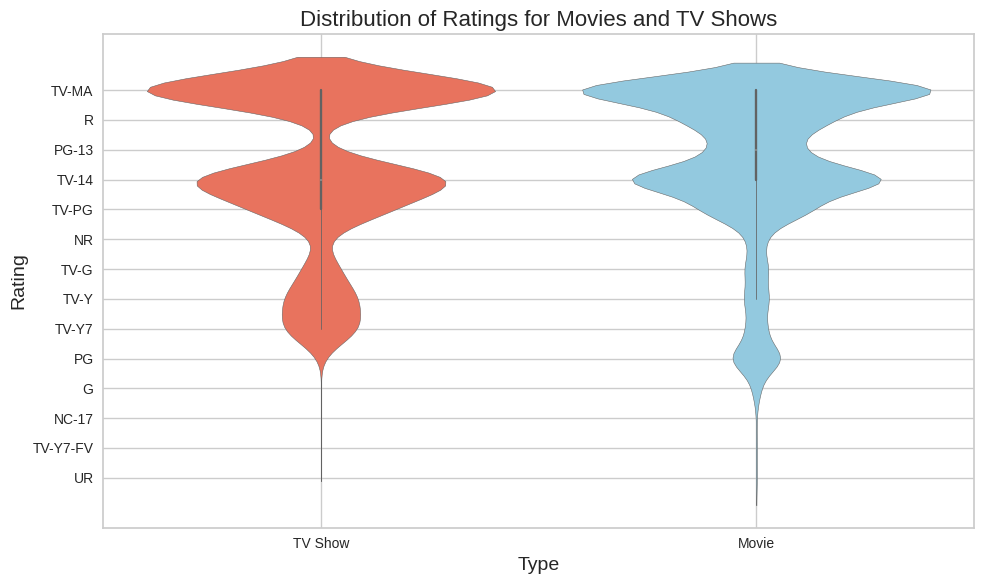

In [191]:
colors = ["#FF6347", "#87CEEB"]

plt.figure(figsize=(10, 6))

sns.violinplot(x='type', y='rating', data=netflix_df, palette=colors)

plt.title('Distribution of Ratings for Movies and TV Shows', fontsize=16)
plt.xlabel('Type', fontsize=14)
plt.ylabel('Rating', fontsize=14)

# Show plot
plt.grid(True)
plt.tight_layout()
plt.show()


##### **1. What is/are the insight(s) found from the chart?**

**TV-MA:** This rating means that the content is intended for mature audiences only. It may include graphic violence, explicit sexual content, or strong language

In terms of ratings, the most common rating is **TV-MA**, which applies to both movies and TV shows.

##### **2. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

* The insight that **TV-MA** is the most common rating for both movies and TV shows can inform content strategies, audience targeting, programming decisions, and content diversity to drive positive business impact in terms of increased viewership and customer satisfaction.

## **10 - Top 15 directors with highest number of Movies and Tv Shows**

In [192]:
# Create a DataFrame with director counts
directors_list = netflix_df.director.value_counts().reset_index().head(16)[1:]
directors_list.rename(columns={'index':'Directors name', 'director':'Count'}, inplace=True)

# Create a bar chart using Plotly
fig = px.bar(directors_list, x='Directors name', y='Count', text_auto=True)

# Generate a list of 25 unique color codes using seaborn
color_palette = sns.color_palette('bright', n_colors=16).as_hex()
fig.update_traces(marker_color=color_palette)

# Add a title and adjust the layout
fig.update_layout(
    title={
        'text': 'Top 15 directors with highest number of Movies and Tv Shows.',
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    autosize=False,
    width=1200,
    height=500
)

# Show the plot
fig.show()


##### **1. What is/are the insight(s) found from the chart?**

* The directors **Raúl Campos** and **Jan Suter** have the highest count in terms of overall Movies and TV shows on Netflix.

## **11 - Most frequent Words in Description**

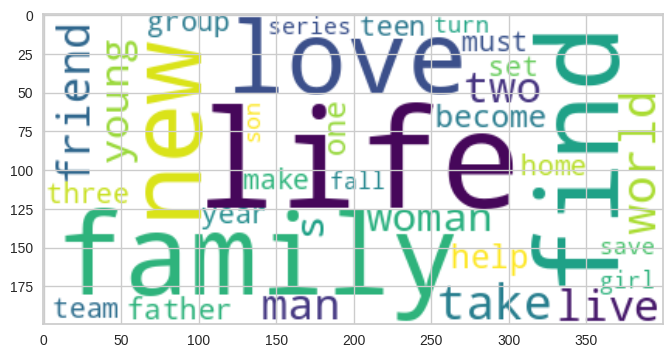

In [193]:
# text documents
text = " ".join(word for word in netflix_df['description'])

# create the word cloud using WordCloud library
wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', min_font_size=15).generate(text)

# plot the word cloud
plt.imshow(wordcloud,  interpolation='bilinear')
plt.show()

**Observation:**
* The most frequently used words in the description column are "family," "find," "life," "love," "new world," and "friend."

## **12 - Distribution of Movies Shows Duration**

In [194]:
#Analysis on distribution of movie show duration
import plotly.express as px
fig =px.histogram(x=netflix_df['duration'])
fig.update_xaxes(categoryorder="total descending")
fig.update_layout(title="DISTRIBUTION OF MOVIES SHOWS DURATION",xaxis_title="Duration of movie Shows")

**1. What is/are the insight(s) found from the chart?**

* The majority of movies have a duration between 90 and 120 minutes.

## **13 - Count of Movies based on Countries**

In [195]:
# Chart - 12 visualization code
country_count=netflix_df['country'].value_counts().sort_values(ascending=False)
country_count=pd.DataFrame(country_count)
topcountries=country_count[0:11]
topcountries

,country
United States,3062
India,923
United Kingdom,397
Japan,226
South Korea,183
Canada,177
Spain,134
France,115
Egypt,101
Turkey,100


In [196]:
data3 = dict(
    number=[3062, 923, 397, 226, 183, 177, 134, 115, 101, 100],
    country=["United States", "India", "United Kingdom", "Canada", "Spain", 'Turkey', 'Philippines', 'France',
             'South Korea', 'Australia']
)

fig = px.funnel(data3,
                x='number',
                y='country',
                title='Funnel Chart- Top 10 Countries by Number of Movies',
                labels={'number': 'Number of Movies', 'country': 'Country'},
                color_discrete_sequence=px.colors.qualitative.Plotly,
                height=1000,
                width=900,
                template='plotly_dark'
                )
fig.show()

##### **1. Why did you pick the specific chart?**

**Answer Here.**

 Funnel charts are often used to represent a gradual reduction in data as it moves through different stages or categories. In this case, the chart visualizes the number of movies in the top 10 countries, showcasing the decreasing count from the top to the bottom.

##### **2. What is/are the insight(s) found from the chart?**

**Answer Here.**

The United States has the highest number of movies, with 3062 films, indicating a dominant presence in the film industry.India is the second-highest contributor with 923 movies, demonstrating a significant presence in the global Movies/Tv shows market.



##### **3. Will the gained insights help creating a positive business impact?**
**Are there any insights that lead to negative growth? Justify with specific reason.**

**Answer Here.**

Yes, the gained insights can help create a positive business impact in several ways:

1 - **Talent Acquisition :** This insight can be valuable for businesses looking to recruit skilled individuals in areas such as filmmaking, writing, acting, or technical roles.

2 - **-Market Expansion:**The insights reveal countries with a significant number of movies, such as the United States and India. This information can guide businesses in expanding their operations and targeting these markets for distribution, marketing, and partnerships.

##**14 - Correlation Heatmap**

In [197]:
#Assigning the Ratings into grouped categories
ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}
netflix_df['target_ages'] = netflix_df['rating'].replace(ratings)

In [198]:
# Preparing data for heatmap
netflix_df['count'] = 1
data = netflix_df.groupby('country')[['country','count']].sum().sort_values(by='count',ascending=False).reset_index()[:10]
data = data['country']


df_heatmap = netflix_df.loc[netflix_df['country'].isin(data)]
df_heatmap = pd.crosstab(df_heatmap['country'],df_heatmap['target_ages'],normalize = "index").T
df_heatmap

country,Canada,Egypt,France,India,Japan,Mexico,South Korea,Spain,United Kingdom,United States
target_ages,,,,,,,,,,
Adults,0.446328,0.277228,0.678261,0.255688,0.367257,0.77,0.469945,0.835821,0.513854,0.471261
Kids,0.180791,0.000000,0.095652,0.016251,0.008850,0.02,0.027322,0.022388,0.093199,0.089484
Older Kids,0.225989,0.039604,0.060870,0.160347,0.269912,0.07,0.120219,0.044776,0.204030,0.195297
Teens,0.146893,0.683168,0.165217,0.567714,0.353982,0.14,0.382514,0.097015,0.188917,0.243958


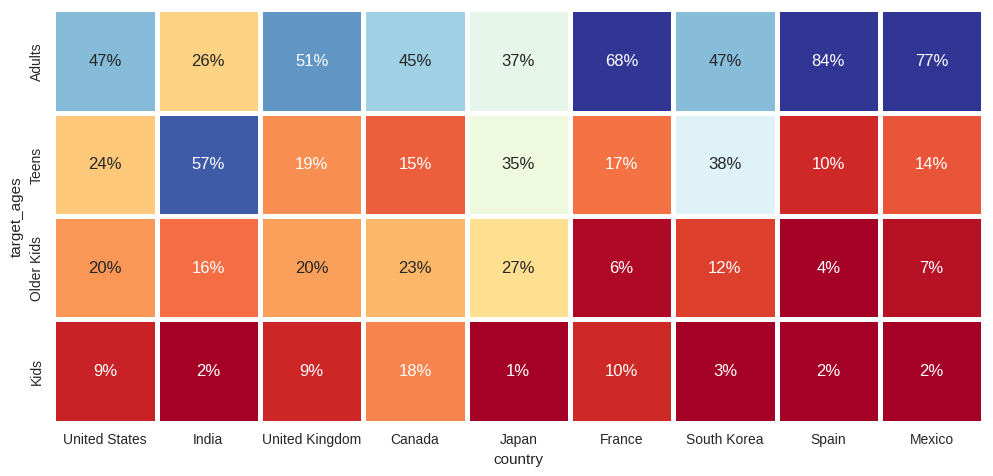

In [199]:
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

country_order2 = ['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain', 'Mexico']
age_order = ['Adults', 'Teens', 'Older Kids', 'Kids']

sns.heatmap(data=df_heatmap.loc[age_order, country_order2],
            cmap='RdYlBu',
            square=True,
            linewidth=2.5,
            cbar=False,
            annot=True,
            fmt='1.0%',
            vmax=.6,
            vmin=0.05,
            ax=ax,
            annot_kws={"fontsize": 12})
plt.show()

##### **1. Why did you pick the specific chart?**

* The heatmap is a suitable choice for this scenario because it allows me to represent the data using color encoding. The color intensity represents the frequency or proportion of movie genres within each age group.

##### **2. What is/are the insight(s) found from the chart?**

* The genre with the highest target audience of 89% adults is stand-up comedy.Children & Family Movies,Comedies also have a significant target audience with 82%. Primarily catering to older kids ,adults, Kids & TV shows have a target audience of around 66% to 53%.

## ***5. Hypothesis Testing***

### **Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.**

Based on above chart experiments i have noticed that some variable of our netflix dataset does not seems to normally distributed so i have made hypothetical assumption that our data is normally distributed and for that i have decided to do statistical analysis.

**1 -**  Average number of movies on Netflix in **United States** is greater than the average number of movies on Netflix in **India**.

**2 -**  The number of **movies** available on Netflix is greater than the number of **TV shows** available on Netflix.

### **Hypothetical Statement - 1**

* Average number of movies on Netflix in **United States** is greater than the average number of movies on Netflix in **India**.

#### **1. State Your research hypothesis as a null hypothesis and alternate hypothesis.**


Null hypothesis: $H_o : μ_{united states} = μ_{india}$

Alternate hypothesis: $H_1 : μ_{united states} \neq μ_{india}$

Test Type: Two-sample t-test

#### **2. Perform an appropriate statistical test.**

In [200]:
# Split the data into the 'united states' and 'india's' movie produced groups
us_movie_df = netflix_df[netflix_df.country == 'United States']
india_movie_df = netflix_df[netflix_df.country == 'India']

In [201]:
# Perform the two-sample t-test between the release years of the two groups of movies
t_stat, p_val = scipy.stats.ttest_ind(us_movie_df['release_year'], india_movie_df['release_year'], equal_var=False)

# Print the results
if p_val < 0.05:
    print(f"Since p-value ({p_val}) is less than 0.05, we reject null hypothesis.\nHence, There is a significant difference in average number of movies produced by the 'United States' and 'India'.")
else:
  print(f"Since p-value ({p_val}) is greater than 0.05, we fail to reject null hypothesis.\nHence, There is no significant difference in average number of movies produced by the 'United States' and 'India'.")

Since p-value (9.605961004903958e-30) is less than 0.05, we reject null hypothesis.
Hence, There is a significant difference in average number of movies produced by the 'United States' and 'India'.


##### **Which statistical test have you done to obtain P-Value?**

* To compare the number of movies available on Netflix in the United States and India, I conducted a two-sample t-test, also known as an independent samples t-test or unpaired t-test. I utilized the ttest_ind function from the scipy.stats module to carry out the test, which is suitable for analyzing the means of two independent samples. By applying this test, I was able to calculate the p-value and determine if there is a significant difference in the number of movies between the two countries.

##### **Why did you choose the specific statistical test?**

* I selected the two-sample t-test for this analysis as it is suitable for comparing the means of two independent samples. In this case, we have two separate sets of movies data from Netflix for the United States and India, and we aim to determine if there is a significant difference in the average number of movies between these two countries.

### **Hypothetical Statement - 2**

* The number of **movies** available on Netflix is greater than the number of **TV shows** available on Netflix.

#### **1. State Your research hypothesis as a null hypothesis and alternate hypothesis.**


Null hypothesis: $H_o : μ_{movie} = μ_{tv show}$

Alternate hypothesis: $H_1 : μ_{movie} \neq μ_{tv show}$

Test Type: Two sample z-test

#### **2. Perform an appropriate statistical test.**

In [202]:
# Perform Statistical Test to obtain P-Value
# Count the number of movies and TV shows in the DataFrame
n_movies = netflix_df[netflix_df['type'] == 'Movie'].count()['type']
n_tv_shows = netflix_df[netflix_df['type'] == 'TV Show'].count()['type']

In [203]:
# Set the counts and sample sizes for the z-test
counts = [n_movies, n_tv_shows]  # Number of movies and TV shows
nobs = [len(data), len(data)]  # Total number of observations in the DataFrame

# Perform a two sample z-test assuming equal proportions
z_stat, p_val = proportions_ztest(counts, nobs, value=0, alternative='larger')

# Print the results
print('Z-statistic:', z_stat)
print('P-value:', p_val)
print()

if p_val < 0.05:
    print(f"Since p-value ({p_val}) is less than 0.05, we reject null hypothesis.\nHence, There is a significant difference in number of 'movies' and 'TV shows' available on Netflix.")
else:
  print(f"Since p-value ({p_val}) is greater than 0.05, we fail to reject null hypothesis.\nHence, There is no significant difference in number of 'movies' and 'TV shows' available on Netflix.")

Z-statistic: nan
P-value: nan

Since p-value (nan) is greater than 0.05, we fail to reject null hypothesis.
Hence, There is no significant difference in number of 'movies' and 'TV shows' available on Netflix.


##### **Which statistical test have you done to obtain P-Value?**

* To compare the number of movies and TV shows available on Netflix, I conducted a two-sample z-test for proportions to obtain the p-value.

##### **Why did you choose the specific statistical test?**

* I choose the two-sample z-test for proportions to compare the number of movies and TV shows available on Netflix because the data consists of two categorical variables.

## ***6. Feature Engineering & Data Pre-processing***

### **6.1 - Handling Missing Values**

In [204]:
# Handling Missing Values & Missing Value Imputation
netflix_df.isna().sum().sum()

0

## **6.2 - Textual Data Preprocessing**

#### **What is textual data preprocessing?**
* Textual data preprocessing is the process of preparing text data for analysis or modeling. It includes a series of steps that are applied to raw text data in order to clean, organize and standardize it so that it can be easily analyzed or used as input for natural language processing or machine learning models. The preprocessing steps typically include tokenization, stop-word removal, stemming or lemmatization, lowercasing, removing punctuation, and removing numbers. The goal of textual data preprocessing is to prepare the data for further analysis and modeling by removing irrelevant information and standardizing the format of the text. This can help improve the accuracy and effectiveness of the analysis or modeling.

#### **Modeling Approach**

**1.**   Choose the attributes that you want to cluster.

**2.**   Text Preprocessing: Change all textual data to lowercase and eliminate all punctuation marks and stopwords. Removing commonly occurring words such as "the", "and", "a", etc. that don't carry much meaning.

**3.**   Stemming or Lemmatization: Normalizing the words by reducing them to their base form.

**4.**   Tokenization: Breaking the text into smaller units, such as sentences or words.

**5.**   Dimensionality reduction.

**6.**   Make use of various algorithms to cluster the movies and various techniques to determine the optimal number of clusters.

**7.**   Build the optimal number of clusters and use wordclouds to display the contents of each cluster.

### **6.2.1 - Selecting Attributes**

In [205]:
# Expand Contraction
netflix_df.head(3)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,day_added,year_added,month_added,target_ages,count
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020.0,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,14,2020,8,Adults,1
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016.0,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,23,2016,12,Adults,1
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011.0,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",20,2018,12,Adults,1


We will cluster the Netflix movies and TV shows into groups based on the following textual characteristics:
* Director
* Cast
* Country
* Rating
* Listed in (genres)
* Description

* **Creating new column including all categorical feature**

In [206]:
# creating tags column using all text column which one is used for model building purpose.
netflix_df['text_data'] = netflix_df['director'] + netflix_df['cast'] + netflix_df['country'] + \
                     netflix_df['rating'] + netflix_df['listed_in'] + netflix_df['description']

In [207]:
# checking the first row
netflix_df['text_data'][0]

'João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso FrateschiBrazilTV-MAInternational TV Shows, TV Dramas, TV Sci-Fi & FantasyIn a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.'

### **6.2.2 - Removing Stop words and Lower Casing.**

In natural language processing (NLP) tasks, removing stop words and lowercasing words are common pre-processing steps.
* **Stop words Removal:**  Words such as "a," "an," "the," and "is," are words that are commonly used in a language but do not convey much meaning. These words can add noise to the data and can sometimes affect the performance of NLP models, so they are often removed as a pre-processing step.

* **Lowercasing:** It is the process of converting all the words in a text to lowercase. This can be useful in tasks such as information retrieval or text classification where case differences are not important and also can reduce the size of the vocabulary making it easier to work with larger texts or texts in languages with a high number of inflected forms.

In [208]:
# create a set of English stop words
stop_words = stopwords.words('english')

# displaying stopwords
np.array(stop_words)

array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [209]:
def stopwords(text):
    '''a function for removing the stopword and lowercase the each word'''
    text = [word.lower() for word in text.split() if word.lower() not in stop_words]
    # joining the list of words with space separator
    return " ".join(text)

In [210]:
# applying stopwords function.
netflix_df['text_data'] = netflix_df['text_data'].apply(stopwords)

In [211]:
# checking the first row again
netflix_df['text_data'][0]

'joão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschibraziltv-mainternational tv shows, tv dramas, tv sci-fi & fantasyin future elite inhabit island paradise far crowded slums, get one chance join 3% saved squalor.'

* **We have successfully changed the corpus to lowercase and removed all stopwords.**

### **6.2.3 - Removing Punctuations**

Removing punctuation is the process of removing any punctuation marks (e.g., periods, commas, exclamation points, etc.) from text data. This is a common pre-processing step in natural language processing (NLP) tasks and text analysis, as punctuation marks often do not carry much meaning and can add noise to the data. Removing punctuation can also make it easier to tokenize text into words or sentences, as punctuation marks often act as delimiters between words or sentences. Additionally, removing punctuation can also help in reducing the size of the vocabulary, which can make it easier to work with larger texts or texts in languages with a high number of inflected forms. It can be done using python libraries such as string, re, and nltk.

In [212]:
# function to remove punctuations

def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # replacing the punctuations with no space, which in effect deletes the punctuation marks.
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)

In [213]:
# applying remove_punctuation function
netflix_df['text_data'] = netflix_df['text_data'].apply(remove_punctuation)

In [214]:
# checking the first row after the process
netflix_df['text_data'][0]

'joão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschibraziltvmainternational tv shows tv dramas tv scifi  fantasyin future elite inhabit island paradise far crowded slums get one chance join 3 saved squalor'

* **We have effectively eliminate all the punctuation marks from the corpus.**

### **6.2.4 - Stemming**

Stemming is the process of reducing a word to its base or root form. This is a common pre-processing step in natural language processing (NLP) tasks and text analysis. The goal of stemming is to reduce words to their base form so that words with the same stem are treated as the same word, even if they are written in different forms. For example, stemming would reduce "running," "runner," and "ran" to the base form "run." This can be useful in tasks such as information retrieval or text classification where the specific form of a word is not important, and it can also help in reducing the size of the vocabulary. There are several stemmers available in python such as Porter stemmer, Snowball stemmer and Lancaster stemmer.

* We will utilize **SnowballStemmer** to construct a meaningful word from a word corpus.

In [215]:
# create an object of stemming function
stemmer = SnowballStemmer("english")

# define a function to apply stemming using SnowballStemmer
def stemming(text):
    '''a function which stems each word in the given text'''
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text)

In [216]:
# appying stemming function
netflix_df['text_data'] = netflix_df['text_data'].apply(stemming)

In [217]:
# checking the first row after the process
netflix_df['text_data'][0]

'joão miguel bianca comparato michel gome rodolfo valent vaneza oliveira rafael lozano vivian porto mel fronckowiak sergio mamberti zezé motta celso frateschibraziltvmaintern tv show tv drama tv scifi fantasyin futur elit inhabit island paradis far crowd slum get one chanc join 3 save squalor'

*  **We have successfully utilized the stemming process.**

### **6.2.4 - Text Vectorization**

Text vectorization is the process of converting text data into numerical vectors or feature representations that can be used for machine learning or data analysis tasks. In simple terms, it transforms the text data into numerical data which can be easily processed by machine learning algorithms. There are several text vectorization techniques available such as bag of words, Tf-idf, Word2vec, and GloVe etc.

* We will be using the TF-IDF vectorizer, which stands for Term Frequency Inverse Document Frequency
* TF(t) = (Number of times term t appears in a document) / (Total number of terms in the document). The more often a word appears in a document, the higher its TF score.
* IDF(t) = IDF measures how rare a word is across all the documents in the corpus. The rarer a word, the higher its IDF score.
* The product of TF and IDF is used to calculate the overall weight of a word in a document, which is known as the TF-IDF score. Words with high TF-IDF scores are considered to be more important and relevant to the document than words with low TF-IDF scores.

In [218]:
# create the object of tfid vectorizer
tfidf = TfidfVectorizer(stop_words='english', lowercase=False, max_features = 10000)   # max features = 10000 to prevent system from crashing

# fit the vectorizer using the text data
tfidf.fit(netflix_df['text_data'])

# collect the vocabulary items used in the vectorizer
dictionary = tfidf.vocabulary_.items()

In [219]:
print(len(dictionary)) #number of independet features created from "text_data" columns

10000


In [220]:
# convert vector into array form for clustering
vector = tfidf.transform(netflix_df['text_data']).toarray()

# summarize encoded vector
print(vector)
print(f'shape of the vector : {vector.shape}')
print(f'datatype : {type(vector)}')

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
shape of the vector : (7787, 10000)
datatype : <class 'numpy.ndarray'>


### **6.2.5 - Dimensionality Reduction**

Dimensionality reduction is the process of reducing the number of features or dimensions in a dataset while retaining as much information as possible. The main goal of dimensionality reduction is to simplify the data while minimizing the loss of information. It is a crucial step in machine learning and data analysis as it can help to improve the performance of models, reduce overfitting, and make it easier to visualize and interpret the data.

* There are several techniques used for dimensionality reduction, such as:
Principal Component Analysis (**PCA**), Linear Discriminant Analysis (**LDA**), t-Distributed Stochastic Neighbor Embedding (**t-SNE**), Autoencoder, and Random Projection etc.
* **We will use Principal Component Analysis (PCA) to reduce the dimensionality of data.**

In [221]:
# using PCA to reduce dimensionality
pca = PCA(random_state=42)
pca.fit(vector)

PCA(random_state=42)

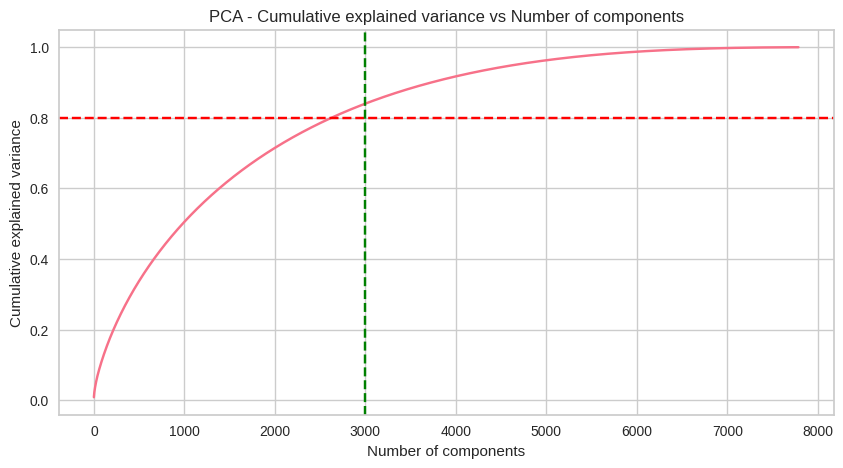

In [222]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - Cumulative explained variance vs Number of components')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3000, color='green', linestyle='--')
plt.show()

* We discover that approximately 7500 components account for 100 percent of the variance.
* 3000 components alone account for more than 80% of the variance.
* Therefore, we can take the top 3000 components to reduce dimensionality and simplify the model while still being able to capture more than 80% of the variance.

In [223]:
# reducing the dimensions to 3000 using pca
pca = PCA(n_components=3000, random_state=42)
pca.fit(vector)

PCA(n_components=3000, random_state=42)

In [224]:
# transformed features
X = pca.transform(vector)
# shape of transformed vectors
X.shape

(7787, 3000)

## ***7. ML Model Implementation***

<b><u>Clustering</b></u>: -<br>
Clustering can be considered the most important unsupervised learning problem; so, as every other problem of this kind, it deals with finding a structure in a collection of unlabeled data.A loose definition of clustering could be “the process of organizing objects into groups whose members are similar in some way”.A cluster is therefore a collection of objects which are “similar” between them and are “dissimilar” to the objects belonging to other clusters.

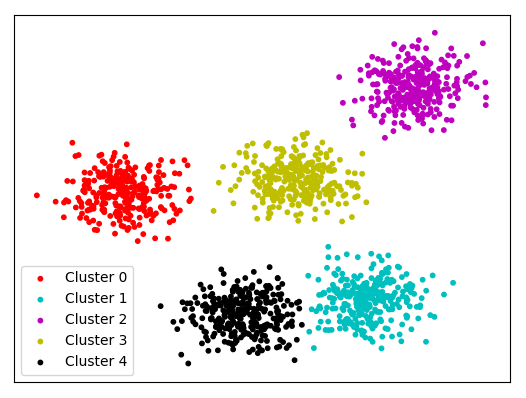

**Type of Clustering Algorithm**
* DBSCAN
* Hierarchical Clustering
* Agglomerative Clustering

**Type of method to decide cluster**

* Elbow Method
* Silhouette Score
* Dendrogram

## **DBSCAN Clustering**

**1 - Checking number of cluster by Elbow Method**

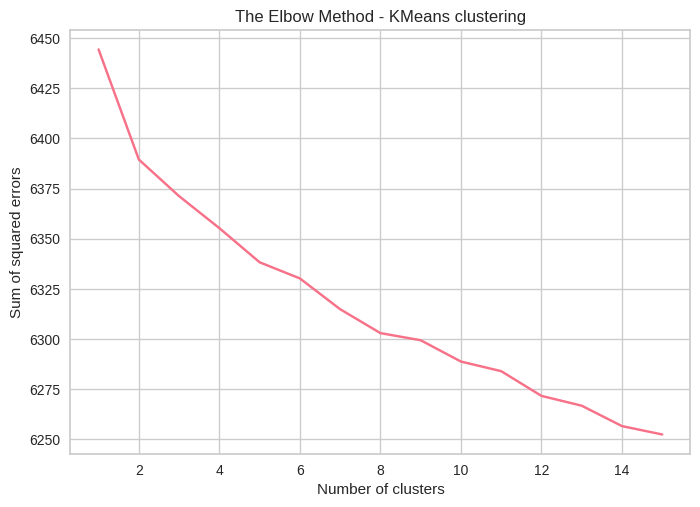

In [225]:
'''Elbow method to find the optimal value of K'''

# Initialize a list to store the sum of squared errors for each value of K
SSE = []

for k in range(1, 16):
  # Initialize the k-means model with the current value of K
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Compute the sum of squared errors for the model
  SSE.append(kmeans.inertia_)

# Plot the values of SSE
plt.plot(range(1, 16), SSE)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.show()

* The sum of squared distance between each point and the centroid in a cluster decreases with the increase in the number of clusters.

**2 - Checking number of cluster by Silhouette Score**

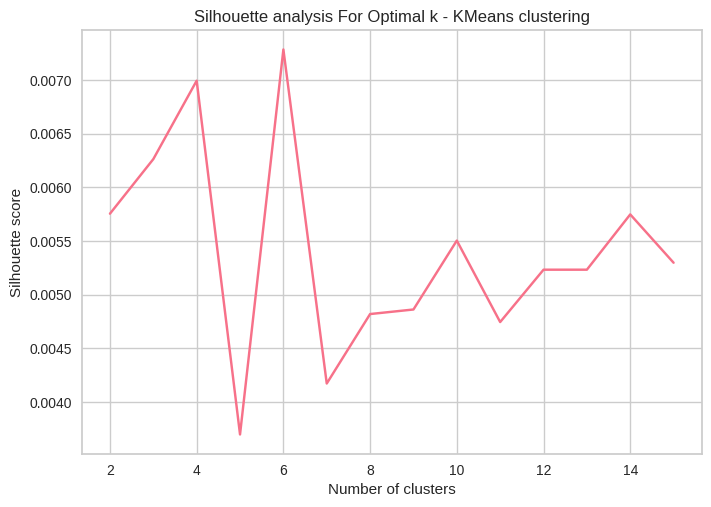

In [226]:
'''Silhouette score method to find the optimal value of k'''

# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

for k in range(2, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Predict the cluster labels for each point in the data
  labels = kmeans.labels_
  # Compute the silhouette score for the model
  score = silhouette_score(X, labels)
  silhouette_avg.append(score)

# Plot the Silhouette analysis
plt.plot(range(2,16), silhouette_avg)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

* The highest Silhouette score is obtained for 6 clusters.
* Building 6 clusters using the k-means clustering algorithm.

In [227]:
# Clustering the data into 6 clusters
kmeans = KMeans(n_clusters=6, init='k-means++', random_state=33)
kmeans.fit(X)

KMeans(n_clusters=6, random_state=33)

In [228]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

(6328.515965739367, 0.008037790166943172)


In [229]:
# Adding a kmeans cluster number attribute
netflix_df['kmeans_cluster'] = kmeans.labels_

In [230]:
netflix_df.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'kmeans_cluster']]

,type,title,director,cast,country,rating,listed_in,description,kmeans_cluster
6081,Movie,The Amityville Horror,Andrew Douglas,"Ryan Reynolds, Melissa George, Chloë Grace Mor...",United States,R,Horror Movies,This hair-raising remake of the 1979 horror hi...,0
686,TV Show,Bad Boy Billionaires: India,,No cast,India,TV-14,"British TV Shows, Docuseries, International TV...",This investigative docuseries explores the gre...,4
6825,TV Show,The Rise of Phoenixes,,"Chen Kun, Ni Ni, Zhao Lixin, Ni Dahong, Yuan H...",China,TV-14,"International TV Shows, Romantic TV Shows, TV ...","When a secret from the past rears its head, a ...",4
2717,Movie,Hickok,Timothy Woodward Jr.,"Luke Hemsworth, Trace Adkins, Kris Kristoffers...",United States,TV-MA,Action & Adventure,"While serving as the marshal of rowdy Abilene,...",0
5862,TV Show,Stunt Science,,No cast,United Kingdom,TV-MA,"British TV Shows, International TV Shows, Real...",When it comes to daring stunts and outrageous ...,4


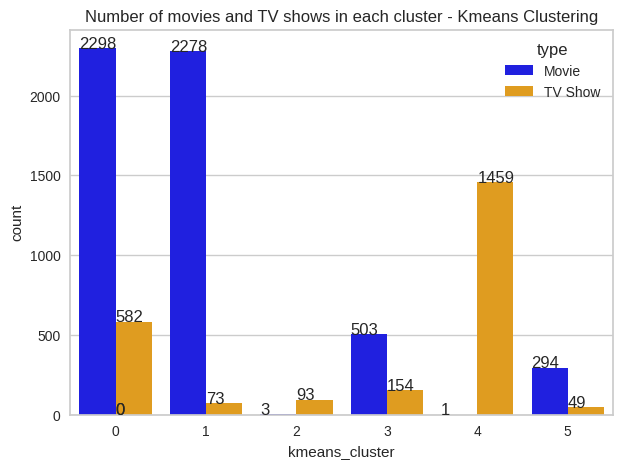

In [231]:
plt.figure(figsize=(7, 5))
graph = sns.countplot(x='kmeans_cluster', data=netflix_df, hue='type', palette={'Movie': 'blue', 'TV Show': 'orange'})
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')

# Adding value count on the top of bar
for p in graph.patches:
    graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

plt.show()

* **Successfully built 6 clusters using the k-means clustering algorithm.**

#### **Building wordclouds for different clusters in K-Means Clustering**

In [232]:
def kmeans_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  netflix_df_wordcloud = netflix_df[['kmeans_cluster',column_name]].dropna()
  netflix_df_wordcloud = netflix_df_wordcloud[netflix_df_wordcloud['kmeans_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in netflix_df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

**Word Cloud on "description" column for different cluster**

cluster 0


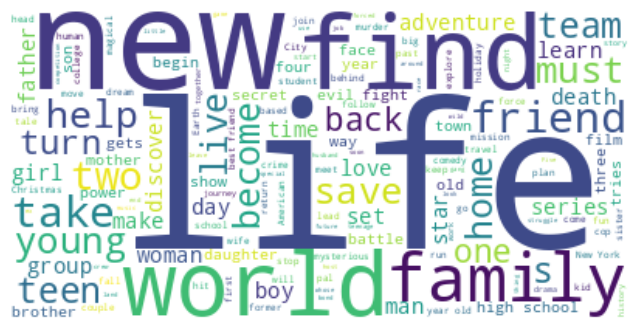

cluster 1


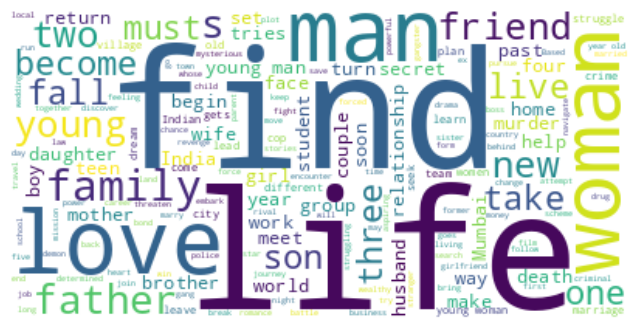

cluster 2


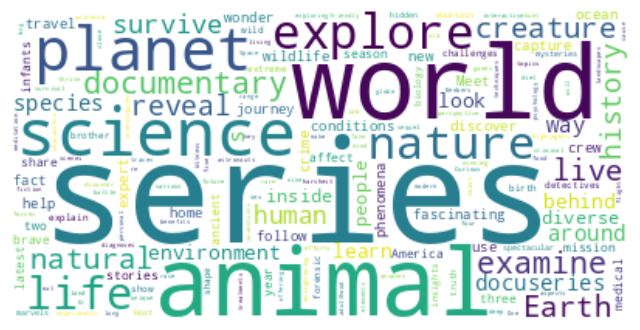

cluster 3


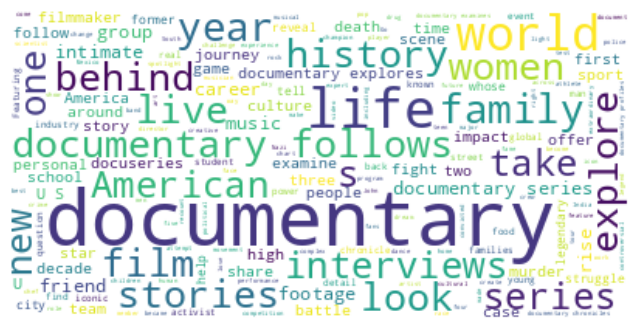

cluster 4


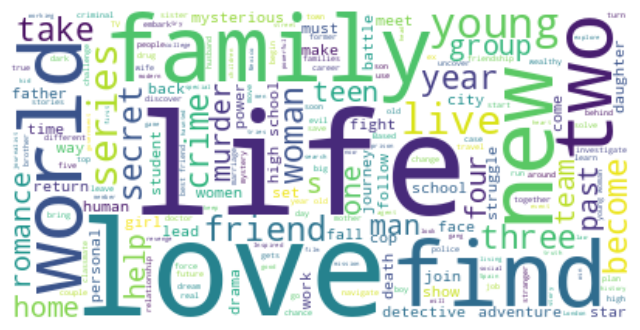

cluster 5


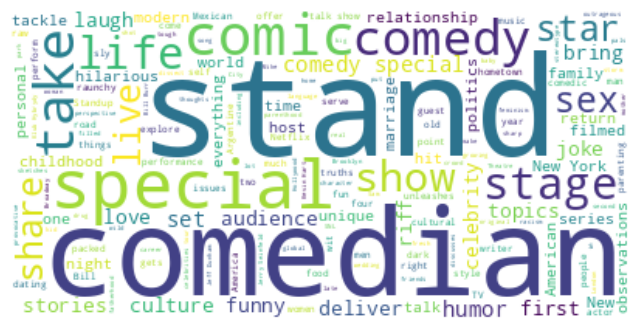

In [233]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'description')

**Word Cloud on "cast" column for different cluster**

cluster 0


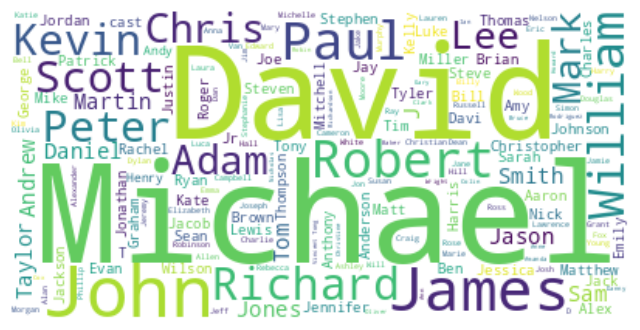

cluster 1


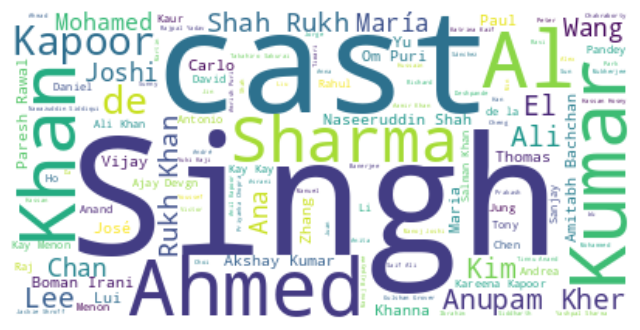

cluster 2


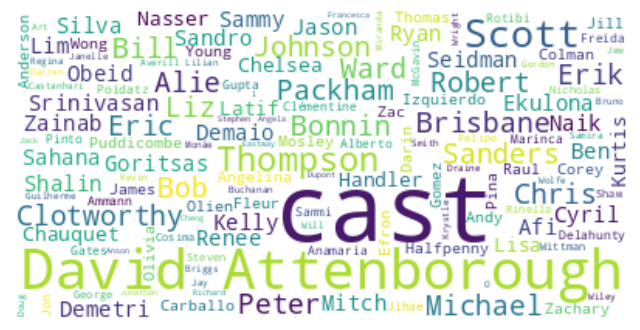

cluster 3


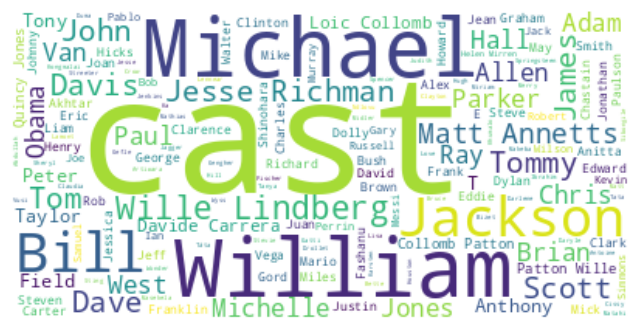

cluster 4


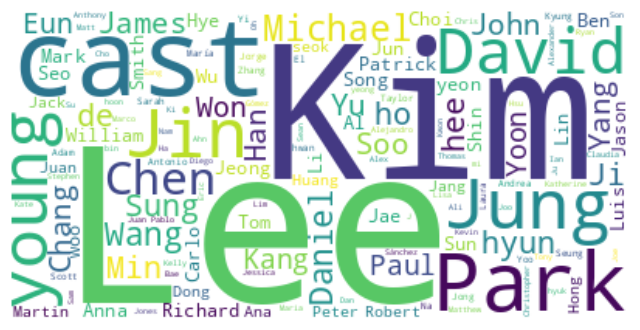

cluster 5


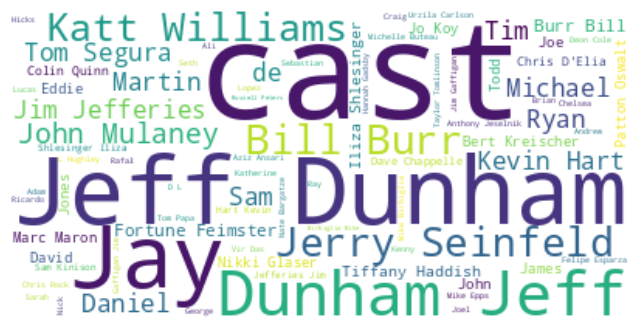

In [234]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

**Word Cloud on "director" column for different cluster**

cluster 0


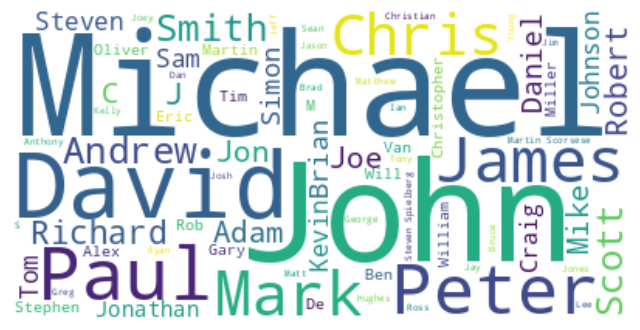

cluster 1


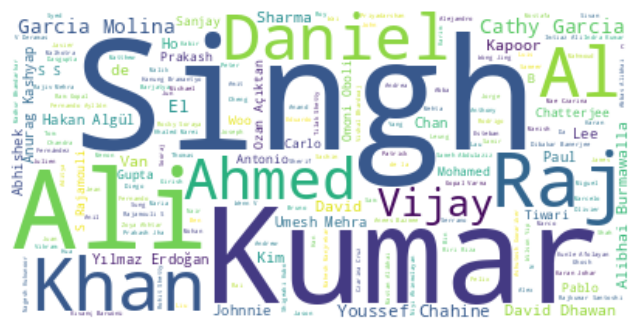

cluster 2


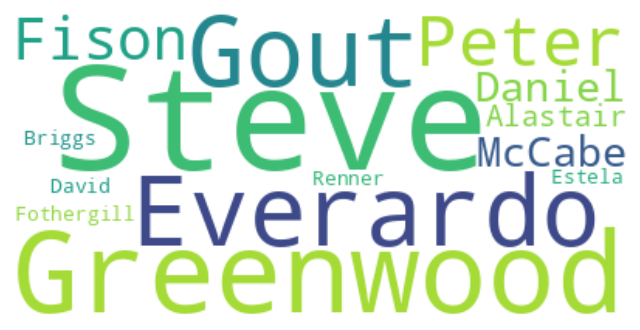

cluster 3


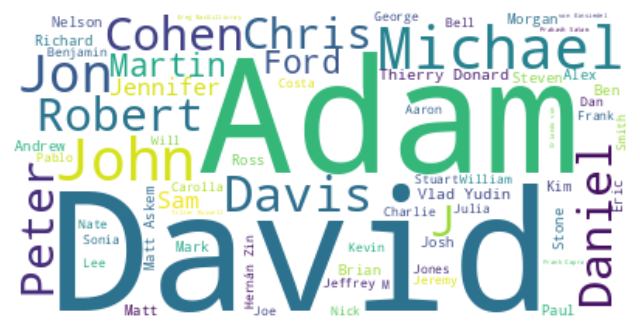

cluster 4


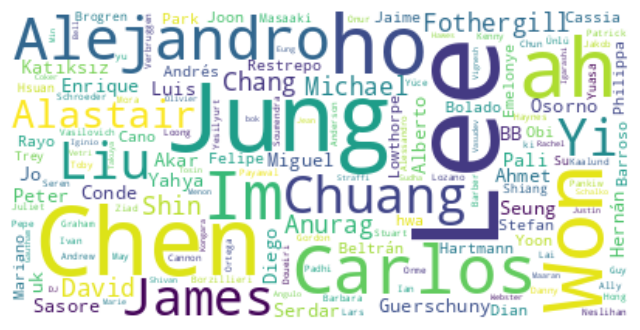

cluster 5


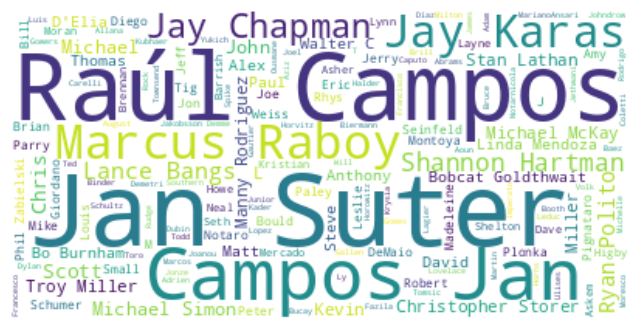

In [235]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'director')

**Word Cloud on "listed_in" (genre) col for different cluster**

cluster 0


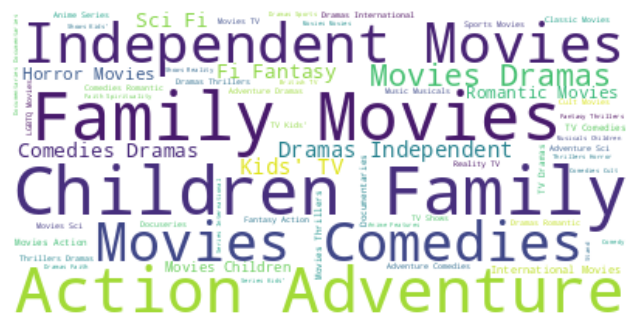

cluster 1


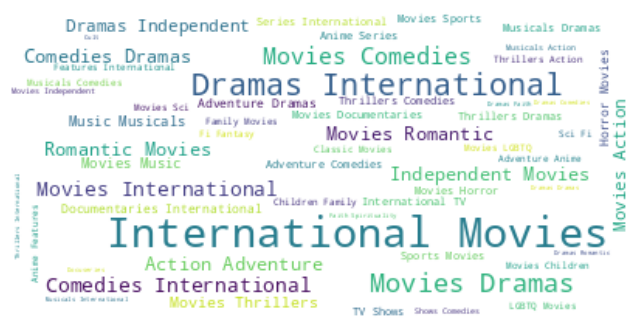

cluster 2


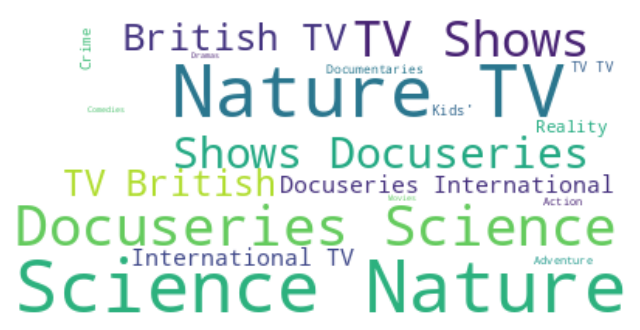

cluster 3


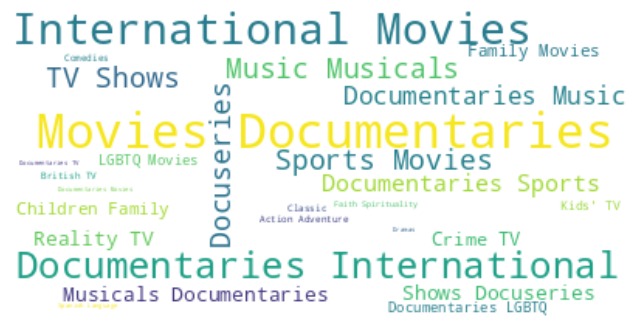

cluster 4


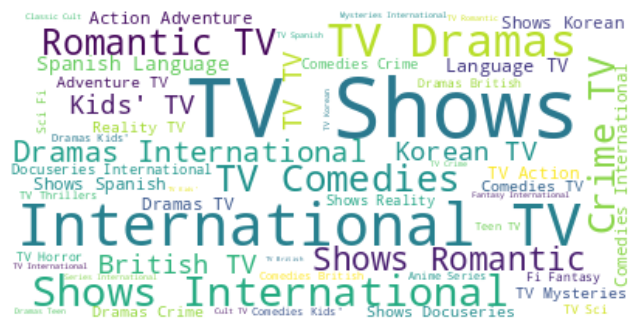

cluster 5


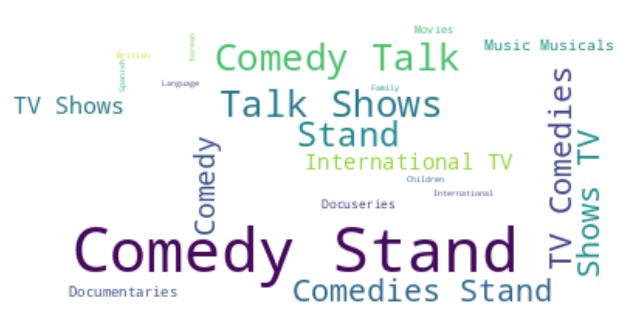

In [236]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'listed_in')

**Word Cloud on "country" col for different cluster**

cluster 0


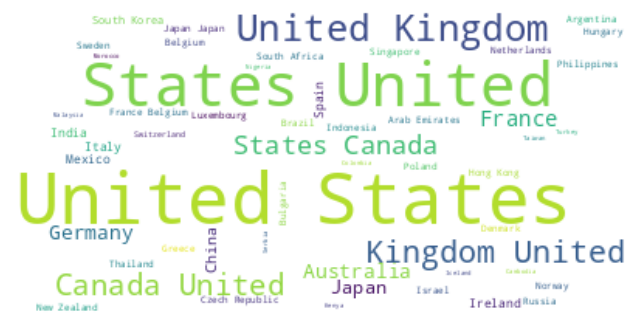

cluster 1


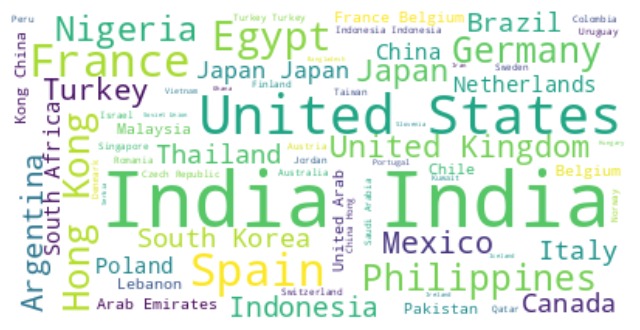

cluster 2


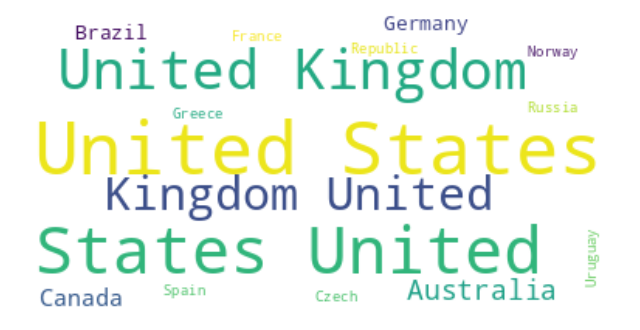

cluster 3


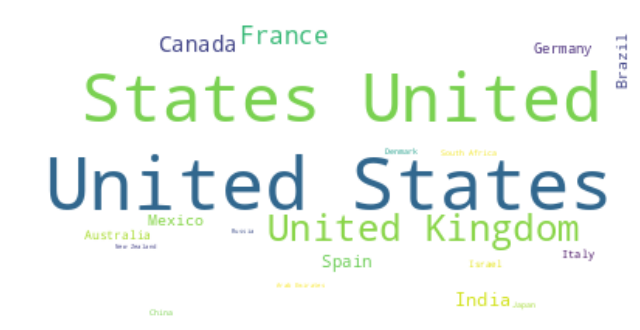

cluster 4


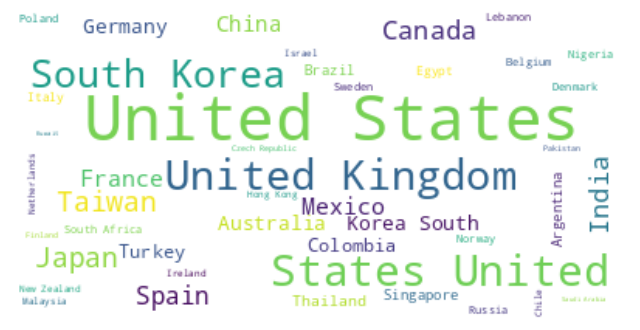

cluster 5


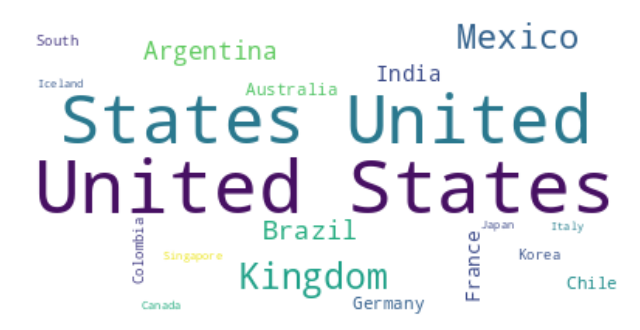

In [237]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

**Word Cloud on "title" col for different cluster**

cluster 0


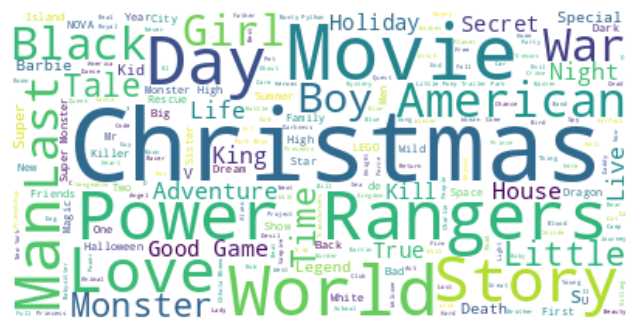

cluster 1


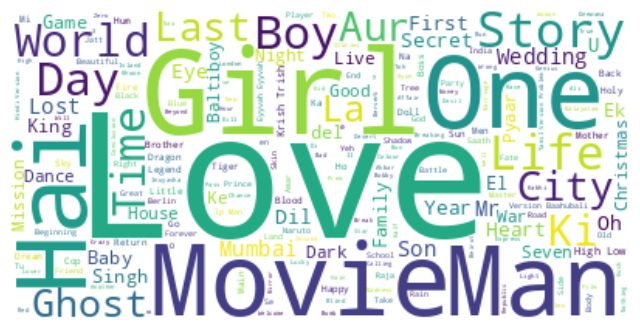

cluster 2


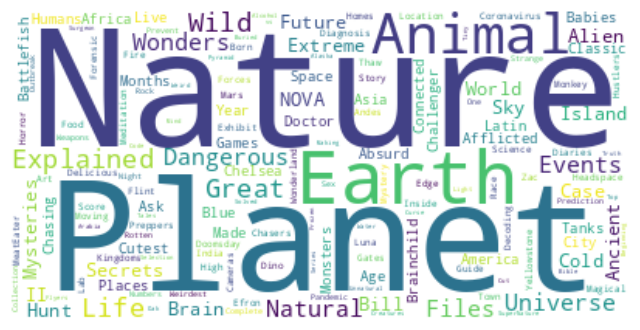

cluster 3


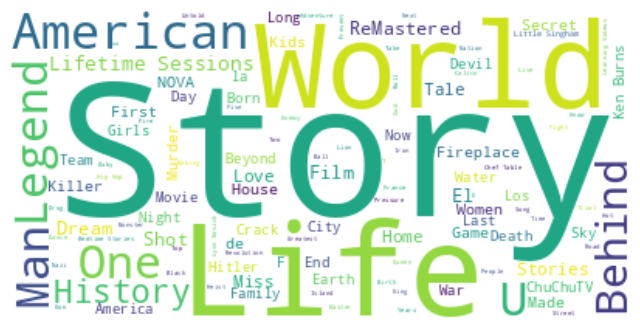

cluster 4


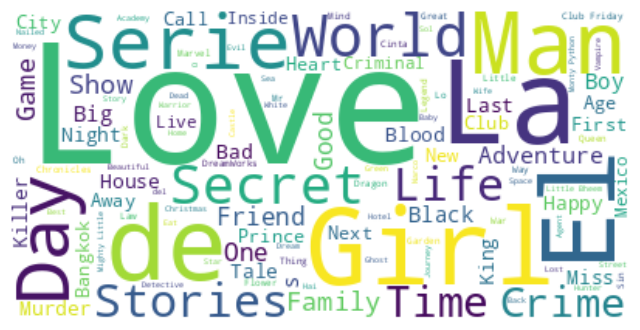

cluster 5


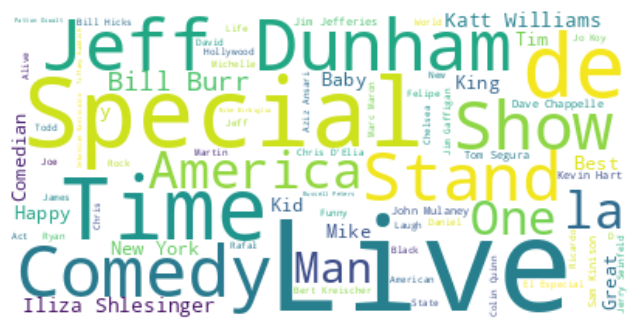

In [238]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'title')

## **Hierarchical clustering**

**Building a dendogram to decide the number of clusters**

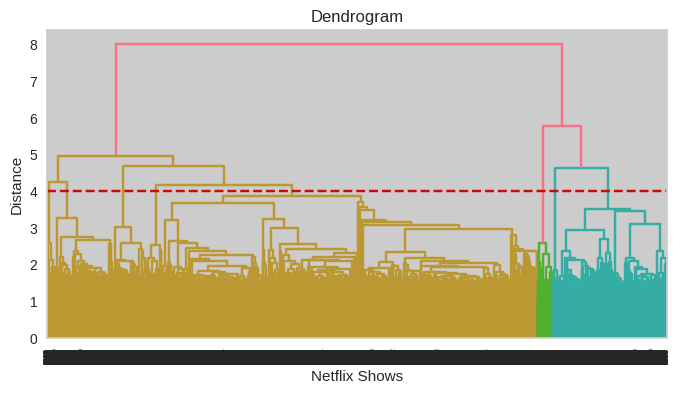

In [239]:
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(8, 4))
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 4, color='r', linestyle='--')

**At a distance of 4 units, 7 clusters can be built using the agglomerative clustering algorithm.**

In [240]:
# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')
hierarchical.fit_predict(X)

array([1, 0, 0, ..., 0, 1, 0])

In [241]:
# Adding a hierarchical cluster number attribute
netflix_df['hierarchical_cluster'] = hierarchical.labels_

In [242]:
netflix_df.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'hierarchical_cluster']]

,type,title,director,cast,country,rating,listed_in,description,hierarchical_cluster
7563,Movie,What the Fish,Gurmmeet Singh,"Dimple Kapadia, Vishal Sharma, Sumit Suri, Ana...",India,TV-14,"Comedies, International Movies",A crabby woman leaves home for a vacation and ...,3
5535,Movie,Shaitan,Bejoy Nambiar,"Rajeev Khandelwal, Kalki Koechlin, Gulshan Dev...",India,TV-MA,"Action & Adventure, Dramas, Independent Movies","When they're blackmailed after a hit-and-run, ...",3
3835,Movie,Machete Kills,Robert Rodriguez,"Danny Trejo, Sofía Vergara, Charlie Sheen, Mic...","United States, Russia",R,Action & Adventure,Killer-for-hire Machete cuts a deal with the U...,0
2460,Movie,GODZILLA The Planet Eater,"Kobun Shizuno, Hiroyuki Seshita","Mamoru Miyano, Takahiro Sakurai, Kana Hanazawa...",Japan,TV-PG,"Action & Adventure, Anime Features, Internatio...","With the earth alliance weakened, Haruo weighs...",0
6855,Movie,The Secret,"Raffi Ahmad, Arie Azis","Nagita Slavina, Raffi Ahmad, Marshanda, Roy Ma...",United States,TV-14,"Horror Movies, International Movies",Learning that her father has married a woman h...,0


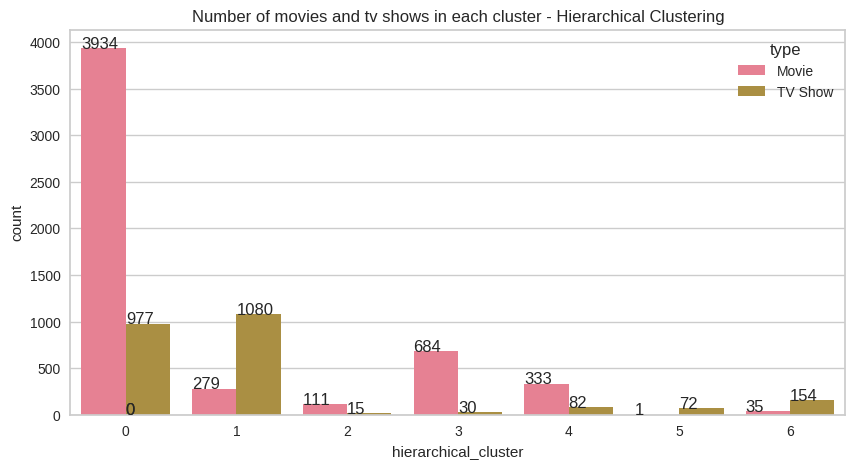

In [243]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(x='hierarchical_cluster',data=netflix_df, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

**Successfully built 7 clusters using the Agglomerative (hierarchical) clustering algorithm.**

## ***8.*** ***Recommendation System***

A content-based recommendation system is a type of recommendation system that suggests items to users based on their similarity to other items that the user has shown interest in. It uses the attributes or features of the items to determine the similarity between them.

* Based on how similar the movies and shows are, we can create a straightforward content-based recommender system.
* The recommender system needs to be able to suggest a list of similar shows that a person who has watched a show on Netflix likes.
* We can use cosine similarity to determine the shows' similarity scores.
* By dividing the dot product of the two vectors by their magnitude values, the similarity between A and B can be calculated. Simply put, the angle between two vectors decreases as the cosine similarity score increases.

In [244]:
# veryfying index
netflix_df[['show_id', 'title', 'text_data']]

,show_id,title,text_data
0,s1,3%,joão miguel bianca comparato michel gome rodol...
1,s2,7:19,jorg michel graudemián bichir héctor bonilla o...
2,s3,23:59,gilbert chantedd chan stella chung henley hii ...
3,s4,9,shane ackerelijah wood john c reilli jennif co...
4,s5,21,robert luketicjim sturgess kevin spacey kate b...
...,...,...,...
7782,s7783,Zozo,josef faresimad creidi antoinett turk elia ger...
7783,s7784,Zubaan,mozez singhvicki kaushal sarahjan dia raaghav ...
7784,s7785,Zulu Man in Japan,nasti cunit statestvmadocumentari intern movi ...
7785,s7786,Zumbo's Just Desserts,adriano zumbo rachel khooaustraliatvpgintern t...


* Our dataframe has a total of 7787 rows, as shown above, and the last index is 7786 due to the deletion of some rows while treating null values.

* In order to construct a content-based recommendation system, we determine the similarity score based on a specific index_id for that particular "tags" column.

* If we are unable to reset the index, there is a good chance that instead of providing an index, we will calculate cosine similarity for another index. in order to avoid this issue and properly address index when developing the recommendation system. The index was simply reset.

In [245]:
# defining new dataframe for building recommandation system
recommender_df = netflix_df.copy()

# reseting index
recommender_df.reset_index(inplace=True)

# checking whether or not reset index properly
recommender_df[['show_id', 'title', 'text_data']]


,show_id,title,text_data
0,s1,3%,joão miguel bianca comparato michel gome rodol...
1,s2,7:19,jorg michel graudemián bichir héctor bonilla o...
2,s3,23:59,gilbert chantedd chan stella chung henley hii ...
3,s4,9,shane ackerelijah wood john c reilli jennif co...
4,s5,21,robert luketicjim sturgess kevin spacey kate b...
...,...,...,...
7782,s7783,Zozo,josef faresimad creidi antoinett turk elia ger...
7783,s7784,Zubaan,mozez singhvicki kaushal sarahjan dia raaghav ...
7784,s7785,Zulu Man in Japan,nasti cunit statestvmadocumentari intern movi ...
7785,s7786,Zumbo's Just Desserts,adriano zumbo rachel khooaustraliatvpgintern t...


* As shown in the dataframe above, the index was successfully reset. The dataset can now be used to construct a content-based recommendation system.

In [246]:
# dropping show-id and index column
recommender_df.drop(columns=['index', 'show_id'], inplace=True)

In [247]:
print(f"before reset index id for movie 'Zero' : {netflix_df[netflix_df['title'] == 'Zozo'].index[0]}")
print(f"after reset index id for movie 'Zero': {recommender_df[recommender_df['title'] == 'Zozo'].index[0]}")

before reset index id for movie 'Zero' : 7782
after reset index id for movie 'Zero': 7782


In [248]:
# calling out transformed array independent features created from text_data(cluster) column after performing PCA for dimenssionality reduction.
X

array([[ 0.15351373, -0.00572911, -0.01648449, ...,  0.00956895,
        -0.01066992, -0.00214419],
       [-0.04141877,  0.01486609,  0.01600951, ..., -0.01508157,
        -0.00855813, -0.00024987],
       [-0.0420839 ,  0.03633923, -0.04601078, ...,  0.0128024 ,
         0.00679797, -0.00557281],
       ...,
       [-0.06962796, -0.01460264,  0.10908126, ...,  0.0162179 ,
        -0.00475947, -0.00713169],
       [ 0.05435204, -0.03705107,  0.03110133, ...,  0.01737663,
         0.02751126,  0.0123943 ],
       [-0.06908732, -0.13877208,  0.16881723, ...,  0.0102166 ,
        -0.00775837,  0.01291969]])

In [249]:
# calculate cosine similarity
similarity = cosine_similarity(X)
similarity

array([[ 1.        ,  0.0839305 ,  0.02110632, ..., -0.02233225,
         0.00991667, -0.01911519],
       [ 0.0839305 ,  1.        , -0.00826638, ...,  0.05878273,
        -0.01109533, -0.01210479],
       [ 0.02110632, -0.00826638,  1.        , ..., -0.0024225 ,
        -0.01019775, -0.01798127],
       ...,
       [-0.02233225,  0.05878273, -0.0024225 , ...,  1.        ,
        -0.006245  ,  0.18400244],
       [ 0.00991667, -0.01109533, -0.01019775, ..., -0.006245  ,
         1.        ,  0.04013748],
       [-0.01911519, -0.01210479, -0.01798127, ...,  0.18400244,
         0.04013748,  1.        ]])

In [250]:
def recommend(movie):
    '''
    This function list down top ten movies on the basis of similarity score for that perticular movie.
    '''
    print(f"If you liked '{movie}', you may also enjoy: \n")

    # find out index position
    index = recommender_df[recommender_df['title'] == movie].index[0]

    # sorting on the basis of simliarity score, In order to find out distaces from recommended one
    distances = sorted(list(enumerate(similarity[index])), reverse=True, key=lambda x:x[1])

    # listing top ten recommenaded movie
    for i in distances[1:11]:
        print(netflix_df.iloc[i[0]].title)

* **Let's check Recommendation Model**

In [251]:
recommend('Golmaal: Fun Unlimited')

If you liked 'Golmaal: Fun Unlimited', you may also enjoy: 

Golmaal Returns
Maine Pyaar Kyun Kiya
Hattrick
Phir Hera Pheri
Ishqiya
C Kkompany
Himmatwala
Saheb Bibi Golaam
Haseena Maan Jaayegi
Kyaa Kool Hain Hum 3


In [252]:
recommend('Breaking Bad')

If you liked 'Breaking Bad', you may also enjoy: 

Better Call Saul
Hormones
Servant of the People
My Life My Story
MINDHUNTER
The Underclass
W/ Bob & David
The School Nurse Files
Killer Inside: The Mind of Aaron Hernandez
Refresh Man


### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**


## **Exploratory Data Analysis Conclusions**
---
---
> * **Netflix began adding videos to the platform from 2008**
> * **The streaming giant started aggressively adding movies and TV shows from 2017**
> * **More movies are added as compared to TV shows**
---
> * **There are almost twice as many movies as TV shows on Netflix.**
---
> * **Most content on Netflix is rated for Mature Audiences and over 14 years old**
---
> **Top Countries in Netflix are:**
1. **United States**
2. **India**
3. **United Kingdom**
4. **Canada**
5. **France**

---
> **Top Genres in Netflix are:**
1. **Drama**
2.**Comedy**
3.**Documentary**
4.**Action and Adventure**
5.**Romance**

---
> **Top Directors on Netflix are:**
1. **Jan Suter**
2.**Raul Campos**
3.**Marcus Raboy**
4.**Jay Karas**
5.**Cathy Garcia-Molina**

---
> **Top Actors on Netflix are:**
1. **Anupam Kher**
2.**Shah Rukh Khan**
3.**Naseeruddin Shah**
4.**Om Puri**
5.**Akshay Kumar**

---
> * **Most movies on Netflix have a duration range from 90 to 110 minutes**
---
> * **Most TV shows on Netflix have a span of only one season**.
---

### <font size='+2' color = '#154085'> <B> End Conclusion.</b>

1. Director and cast contains a large number of null values so we will drop these 2 columns .
2. In this dataset there are two types of contents where 30.86% includes TV shows and the
remaining 69.14% carries Movies.
3. We have reached a conclusion from our analysis from the content added over years that
Netflix is focusing movies and TV shows (Fom 2016 data we get to know that Movies is
increased by 80% and TV shows is increased by 73% compare)
4. From the dataset insights we can conclude that the most number of TV Shows released in
2017 and for Movies it is 2020
5. On Netflix USA has the largest number of contents. And most of the countries preferred to
produce movies more than TV shows.
6. Most of the movies are belonging to 3 categories
7. TOP 3 content categories are International movies , dramas , comedies.
8. In text analysis (NLP) I used stop words, removed punctuations , stemming & TF-IDF
vectorizer and other functions of NLP.
9. Applied different clustering models like Kmeans, hierarchical, Agglomerative clustering,
DBSCAN on data we got the best cluster arrangements.
10.By applying different clustering algorithms to our dataset .we get the optimal number of
cluster is equal to 3


### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***